### CASA0002

# Urban Simulation
***

![img](https://tfl.gov.uk/cdn/static/cms/images/london-rail-and-tube-services-map.gif)

In [1]:
# we will import all the necessary libraries
import pandas as pd
import numpy as np
import geopandas as gpd
import seaborn as sns
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.pyplot import cm
import json
import re
from shapely.geometry import Point, LineString #this library is for manipulating geometric objects, and it is what geopandas uses to store geometries
from scipy.spatial import distance

In [2]:
# read csv file
london_flows = pd.read_csv("london_flows.csv")
london_flows.head(5)
# london_flows.shape (61474, 6)

,station_origin,station_destination,flows,population,jobs,distance
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097
1,Abbey Road,Beckton,1,599,442,8510.121774
2,Abbey Road,Blackwall,3,599,665,3775.448872
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220
4,Abbey Road,Canning Town,37,599,15428,2228.923167


In [3]:
london_flows["flows"].max()

15946

In [4]:
london_flows["flows"].min()

0

In [5]:
london_flows["distance"].max()

60633.323742438224

In [6]:
london_flows["distance"].min()

0.0

### R2

In [7]:
import scipy.stats

def CalcRSquared(observed, estimated):
    """Calculate the r^2 from a series of observed and estimated target values
    inputs:
    Observed: Series of actual observed values
    estimated: Series of predicted values"""
    
    r, p = scipy.stats.pearsonr(observed, estimated)
    R2 = r **2
    
    return R2

### RMSE

In [9]:
from math import sqrt

def CalcRMSE(observed, estimated):
    """Calculate Root Mean Square Error between a series of observed and estimated values
    inputs:
    Observed: Series of actual observed values
    estimated: Series of predicted values"""
    
    res = (observed -estimated)**2
    RMSE = round(sqrt(res.mean()), 3)
    
    return RMSE


Text(0, 0.5, 'Total Flows')

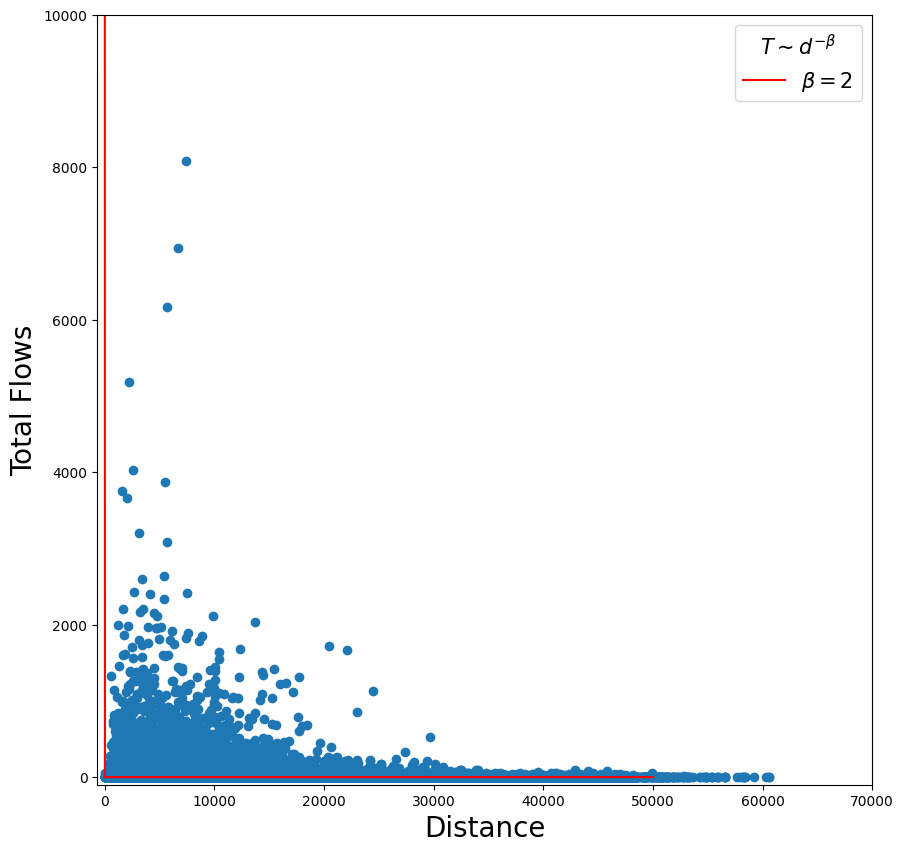

In [11]:
#first plot the Total commuter flows denoted by T against distance denoted by d
#and then fit a model line T ~ d^-beta with beta=2

#set the base axis 
fig, ax = plt.subplots(figsize=(10,10))

#scatter plot 
ax.scatter(x = london_flows["distance"], y=london_flows["flows"])

#line plot 
line = np.arange(0.0002, 50_000, 0.1)
ax.plot(line, line**-2, color ="r", label = "$\\beta=2$")

#add a legend 
ax.legend(title = "$T \\sim d^{-\\beta}$", fontsize = 15, title_fontsize=15)

#axis limits 
ax.set_xlim([-700,70000])
ax.set_ylim([-100, 10000])

#set the labels
ax.set_xlabel("Distance", fontsize = 20)
ax.set_ylabel("Total Flows", fontsize = 20)

### OD pairs

In [12]:
import numpy as np
#now we can create a pivot table to turn paired list into a matrix, and compute the margin as well
flows_original_mat = pd.pivot_table(london_flows, values ="flows", index="station_origin", columns = "station_destination",
                            aggfunc=np.sum, margins=True)
flows_original_mat

C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\3531114603.py:3: FutureWarning: The provided callable <function sum at 0x000002917FE94860> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  flows_original_mat = pd.pivot_table(london_flows, values ="flows", index="station_origin", columns = "station_destination",
C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\3531114603.py:3: FutureWarning: The provided callable <function sum at 0x000002917FE94860> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  flows_original_mat = pd.pivot_table(london_flows, values ="flows", index="station_origin", columns = "station_destination",
C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\3531114603.py:3: FutureWarning: The provided callable <function sum

station_destination,Abbey Road,Acton Central,Acton Town,Aldgate,Aldgate East,All Saints,Alperton,Amersham,Anerley,Angel,...,Wimbledon,Wimbledon Park,Wood Green,Wood Lane,Wood Street,Woodford,Woodgrange Park,Woodside Park,Woolwich Arsenal,All
station_origin,,,,,,,,,,,,,,,,,,,,,
Abbey Road,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.0,599
Acton Central,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,1224
Acton Town,NaN,NaN,NaN,3.0,17.0,NaN,35.0,0.0,NaN,11.0,...,77.0,3.0,6.0,9.0,NaN,0.0,NaN,0.0,NaN,3745
Aldgate,NaN,NaN,0.0,NaN,0.0,NaN,NaN,0.0,NaN,17.0,...,0.0,NaN,4.0,8.0,NaN,0.0,NaN,0.0,NaN,2886
Aldgate East,NaN,NaN,2.0,0.0,NaN,NaN,0.0,0.0,NaN,20.0,...,24.0,0.0,0.0,12.0,NaN,1.0,NaN,1.0,NaN,3172
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Woodford,NaN,NaN,2.0,5.0,47.0,NaN,NaN,NaN,NaN,22.0,...,2.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,4868
Woodgrange Park,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,530
Woodside Park,NaN,NaN,1.0,26.0,11.0,NaN,0.0,NaN,NaN,59.0,...,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,3093


In [13]:
london_flows.head(5)
# london_flows.shape (61474, 6)

,station_origin,station_destination,flows,population,jobs,distance
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097
1,Abbey Road,Beckton,1,599,442,8510.121774
2,Abbey Road,Blackwall,3,599,665,3775.448872
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220
4,Abbey Road,Canning Town,37,599,15428,2228.923167


### Unconstrained Model

In [14]:
flows_1 = london_flows.copy()

In [15]:
flows_1.head(5)

,station_origin,station_destination,flows,population,jobs,distance
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097
1,Abbey Road,Beckton,1,599,442,8510.121774
2,Abbey Road,Blackwall,3,599,665,3775.448872
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220
4,Abbey Road,Canning Town,37,599,15428,2228.923167


In [16]:
flows_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61474 entries, 0 to 61473
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   station_origin       61474 non-null  object 
 1   station_destination  61474 non-null  object 
 2   flows                61474 non-null  int64  
 3   population           61474 non-null  int64  
 4   jobs                 61474 non-null  int64  
 5   distance             61474 non-null  float64
dtypes: float64(1), int64(3), object(2)
memory usage: 2.8+ MB


In [21]:
flows_2 = london_flows.copy()

Text(0, 0.5, 'log(Total)')

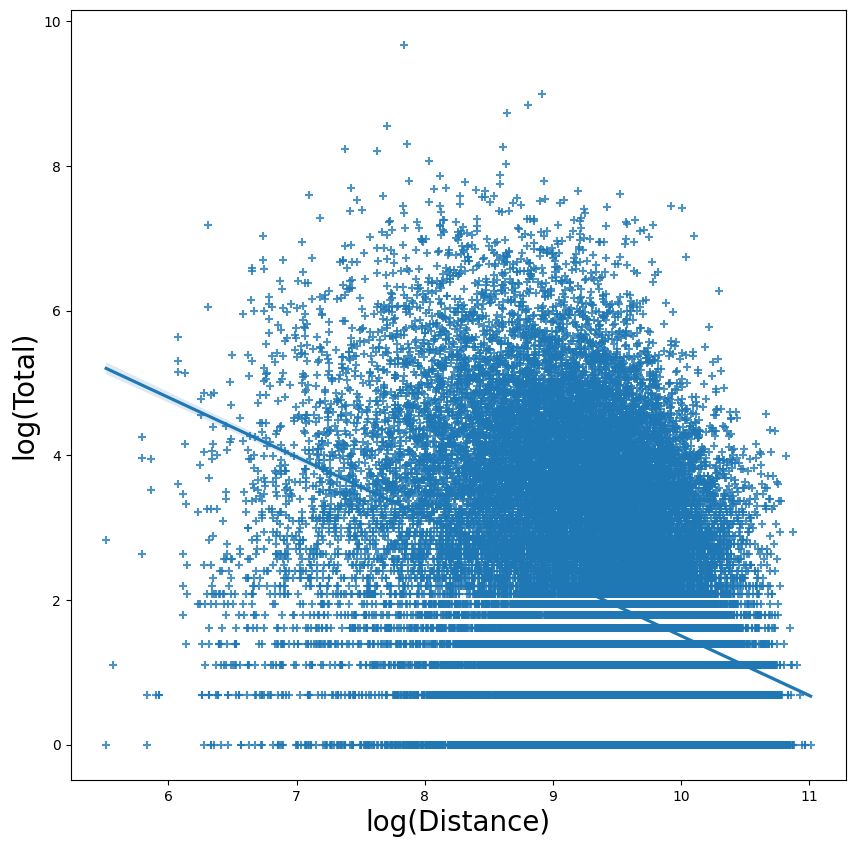

In [22]:
#subset the dataframe to the flows we want
flows_2_change = flows_2[["flows", "distance"]]

#remove all 0 values (logarithms can't deal with 0 values)
flows_2_change = flows_2_change[(flows_2_change!=0).all(1)]

#extract the x and y converting to log
x = np.log(flows_2_change["distance"])
y = np.log(flows_2_change["flows"])

#create the subplot
fig, ax = plt.subplots(figsize = (10,10))

#plot the results along with the line of best fit
sns.regplot(x=x, y=y, marker="+", ax=ax)
ax.set_xlabel("log(Distance)", fontsize = 20)
ax.set_ylabel("log(Total)", fontsize = 20)

In [24]:
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf

#take the variables and produce logarithms of them
x_variables = ["population", "jobs", "distance"]
log_x_vars = []

for x in x_variables:
    flows_2[f"{x}_positive"] = np.where(flows_2[x] <= 0, 1e-6, flows_2[x])
    flows_2[f"log_{x}"] = np.log(flows_2[f"{x}_positive"])
    log_x_vars.append(f"log_{x}")

formula = 'flows ~ ' + ' + '.join(log_x_vars)

uncosim = smf.glm(formula=formula, data=flows_2, family=sm.families.Poisson()).fit()


In [25]:
#extract the summary of the constrained model
print(uncosim.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  flows   No. Observations:                61474
Model:                            GLM   Df Residuals:                    61470
Model Family:                 Poisson   Df Model:                            3
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -1.4583e+06
Date:                Mon, 29 Apr 2024   Deviance:                   2.7444e+06
Time:                        23:28:53   Pearson chi2:                 6.82e+06
No. Iterations:                    20   Pseudo R-squ. (CS):              1.000
Covariance Type:            nonrobust                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept        -10.0917      0.010  -1007.

$K$ (intercept) = -10.0917. Recall $K=\ln k$, hence $k$ can NEVER be negative!

$\alpha$ = 0.8134

$\gamma$ = 0.8320

and $\beta$ = 0.0723 recall in equation (6) there is a negative sign in front of $\beta$. 

In [26]:
#first assign the parameter values from the model to the appropriate variables
K = uncosim.params[0]
alpha = uncosim.params[1]
gamma = uncosim.params[2]
beta = -uncosim.params[3]

#now plug everything back into the Equation 6 model ... 
#be careful with the negative signing of the parameter beta
flows_2["unconstrainedEst2"] = np.exp(K 
                                       + alpha*flows_2["log_population"] 
                                       + gamma*flows_2["log_jobs"] 
                                       - beta*flows_2["log_distance"])

#or we can just extract the results from the actual poisson regression and apply them to the data
predictions = uncosim.get_prediction()
predictions_summary_frame = predictions.summary_frame()
flows_2["fitted"] = predictions_summary_frame["mean"]

C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\1905155983.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  K = uncosim.params[0]
C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\1905155983.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  alpha = uncosim.params[1]
C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\1905155983.py:4: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  gamma = uncosim.params[2]
C:\Users\avb19\AppDa

In [27]:
uncosim.mu

array([46.40300804,  0.62123076,  0.92552719, ...,  4.61759127,
        9.39191102, 11.87936125])

In [28]:
#round the numbers so that we don't get a half of a person
flows_2["unconstrainedEst2"] = round(flows_2["unconstrainedEst2"], 0)
#convert to integers
flows_2["unconstrainedEst2"] = flows_2["unconstrainedEst2"].astype(int)
#check that the sum of these estimates make sense
sum(flows_2["unconstrainedEst2"])

1542315

### Test R2 & RMSE

In [29]:
CalcRSquared(london_flows["flows"], flows_2["unconstrainedEst2"])

0.25625541586794515

In [30]:
CalcRMSE(london_flows["flows"], flows_2["unconstrainedEst2"])

113.343

In [31]:
flows_2.head(5)

,station_origin,station_destination,flows,population,jobs,distance,population_positive,log_population,jobs_positive,log_jobs,distance_positive,log_distance,unconstrainedEst2,fitted
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,599.0,6.395262,78549.0,11.271478,8131.525097,9.003504,46,46.403008
1,Abbey Road,Beckton,1,599,442,8510.121774,599.0,6.395262,442.0,6.091310,8510.121774,9.049012,1,0.621231
2,Abbey Road,Blackwall,3,599,665,3775.448872,599.0,6.395262,665.0,6.499787,3775.448872,8.236275,1,0.925527
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,599.0,6.395262,58772.0,10.981421,5086.514220,8.534348,38,37.711347
4,Abbey Road,Canning Town,37,599,15428,2228.923167,599.0,6.395262,15428.0,9.643939,2228.923167,7.709274,13,13.154986


### 2. Production-constrained Model


$$
T_{ij} = A_i O_i D_j^\gamma d_{ij}^{-\beta}
$$

Where

$$
O_i = \sum_j T_{ij}
$$

and

$$
A_i = \frac{1}{\sum_j D_j^\gamma d_{ij}^{-\beta}}
$$

In the production-constrained model, $O_i$ does not have a parameter as it is a known constraint. $A_i$ is known as a <i>balancing factor</i> and is a vector of values which relate to each origin, $i$, which do the equivalent job to $k$ in the unconstrained/total constrained model but ensure that flow estimates from each origin sum to the known totals, $O_i$ rather than just the overall total.

Now at this point, we could calculate all of the $O_i$s and $A_i$s by hand for our sample system and then set about guessing/estimating the parameter values for the rest of the model, but as you might have already suspected from last time, we can use Python and `glm` to make it really easy and do all of that for us -woo hoo!

We set about re-specifying the Production Constrained model as a Poisson regression model in exactly the same way as we did before. We need to take logs of the right-hand side of the equation and assume that these are logarithmically linked to the Poisson distributed mean ($\lambda_{ij}$) of the $T_{ij}$ variable. As such, Equation (1) becomes:

$$
\lambda_{ij} = \exp (\alpha_i + \gamma \ln D_j - \beta \ln d_{ij})
$$

In Equation (4) $\alpha_i$ is the equivalent of the vector of balancing factors $A_i$, but in regression /log-linear modelling terminology can also be described as either <b>dummy variables</b> or <b>fixed effects</b>. In practical terms, what this means is that in our regression model, $\alpha_i$ is modelled as a [categorical predictor](https://en.wikipedia.org/wiki/Categorical_variable) and therefore in the Poisson regression model, we don't use the numeric values of $O_i$, we can use a categorical identifier for the origin. In terms of the example table above, for Barking and Dagenham we wouldn't use 5675 as we would if we were fitting Equation (1), we would just used 'Barking and Dagenham'.

So, let's give this model a whirl...

In [32]:
flows_3 = flows_2.copy()

In [33]:
flows_3.head(5)

,station_origin,station_destination,flows,population,jobs,distance,population_positive,log_population,jobs_positive,log_jobs,distance_positive,log_distance,unconstrainedEst2,fitted
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,599.0,6.395262,78549.0,11.271478,8131.525097,9.003504,46,46.403008
1,Abbey Road,Beckton,1,599,442,8510.121774,599.0,6.395262,442.0,6.091310,8510.121774,9.049012,1,0.621231
2,Abbey Road,Blackwall,3,599,665,3775.448872,599.0,6.395262,665.0,6.499787,3775.448872,8.236275,1,0.925527
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,599.0,6.395262,58772.0,10.981421,5086.514220,8.534348,38,37.711347
4,Abbey Road,Canning Town,37,599,15428,2228.923167,599.0,6.395262,15428.0,9.643939,2228.923167,7.709274,13,13.154986


In [34]:
#create the formula (the "-1" indicates no intercept in the regression model).
formula = 'flows ~ station_origin + log_jobs + log_distance-1'

#run a production constrained sim 
prodSim = smf.glm(formula = formula, data=flows_3, family=sm.families.Poisson()).fit()

#let's have a look at it's summary 
print(prodSim.summary())

# takes: 50s

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  flows   No. Observations:                61474
Model:                            GLM   Df Residuals:                    61073
Model Family:                 Poisson   Df Model:                          400
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -1.2561e+06
Date:                Mon, 29 Apr 2024   Deviance:                   2.3400e+06
Time:                        23:30:04   Pearson chi2:                 4.70e+06
No. Iterations:                    26   Pseudo R-squ. (CS):              1.000
Covariance Type:            nonrobust                                         
                                                  coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

## 2.1 Model Estimates

Now at this point you will be wanting to know what effect the constraints have had on the estimates produced by the model, so let's plug the parameters back into Equation 4 and take a look...

Create some $O_i$ and $D_j$ columns and store the total in and out flow matrix margins in them. 

In [35]:
#create some Oi and Dj columns in the dataframe and store row and column totals in them:
#to create O_i, take cdatasub ...then... group by origcodenew ...then... summarise by calculating the sum of Total

O_i = pd.DataFrame(flows_3.groupby(["station_origin"])["flows"].agg(np.sum))
O_i.rename(columns={"flows":"O_i"}, inplace = True)
flows_3 = flows_3.merge(O_i, on = "station_origin", how = "left" )

D_j = pd.DataFrame(flows_3.groupby(["station_destination"])["flows"].agg(np.sum))
D_j.rename(columns={"flows":"D_j"}, inplace = True)
flows_3 = flows_3.merge(D_j, on = "station_destination", how = "left" )

C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\3143758874.py:5: FutureWarning: The provided callable <function sum at 0x000002917FE94860> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  O_i = pd.DataFrame(flows_3.groupby(["station_origin"])["flows"].agg(np.sum))
C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\3143758874.py:11: FutureWarning: The provided callable <function sum at 0x000002917FE94860> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  D_j = pd.DataFrame(flows_3.groupby(["station_destination"])["flows"].agg(np.sum))


In [36]:
flows_3.head(5)

,station_origin,station_destination,flows,population,jobs,distance,population_positive,log_population,jobs_positive,log_jobs,distance_positive,log_distance,unconstrainedEst2,fitted,O_i,D_j
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,599.0,6.395262,78549.0,11.271478,8131.525097,9.003504,46,46.403008,599,78549
1,Abbey Road,Beckton,1,599,442,8510.121774,599.0,6.395262,442.0,6.091310,8510.121774,9.049012,1,0.621231,599,442
2,Abbey Road,Blackwall,3,599,665,3775.448872,599.0,6.395262,665.0,6.499787,3775.448872,8.236275,1,0.925527,599,665
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,599.0,6.395262,58772.0,10.981421,5086.514220,8.534348,38,37.711347,599,58772
4,Abbey Road,Canning Town,37,599,15428,2228.923167,599.0,6.395262,15428.0,9.643939,2228.923167,7.709274,13,13.154986,599,15428


**Now we want to fish the coefficients out of the prodSim glm object.**



In [37]:
#We can do this by pulling out the parameter values
# 我们可以通过提取参数值来做到这一点
coefs = pd.DataFrame(prodSim.params)
coefs.head(5)

,0
station_origin[Abbey Road],-3.718270
station_origin[Acton Central],-3.005224
station_origin[Acton Town],-3.585502
station_origin[Aldgate],-3.921088
station_origin[Aldgate East],-3.840199


In [38]:
coefs.reset_index(inplace=True)
coefs.head(5)

,index,0
0,station_origin[Abbey Road],-3.718270
1,station_origin[Acton Central],-3.005224
2,station_origin[Acton Town],-3.585502
3,station_origin[Aldgate],-3.921088
4,station_origin[Aldgate East],-3.840199


In [39]:
coefs.rename(columns = {0:"alpha_i", "index":"coef"}, inplace = True)
coefs.head(5)

,coef,alpha_i
0,station_origin[Abbey Road],-3.718270
1,station_origin[Acton Central],-3.005224
2,station_origin[Acton Town],-3.585502
3,station_origin[Aldgate],-3.921088
4,station_origin[Aldgate East],-3.840199


In [40]:
to_repl = ["(station_origin)", "\[", "\]"]
coefs.head(5)

<>:1: SyntaxWarning: invalid escape sequence '\['
<>:1: SyntaxWarning: invalid escape sequence '\]'
<>:1: SyntaxWarning: invalid escape sequence '\['
<>:1: SyntaxWarning: invalid escape sequence '\]'
C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\1159464615.py:1: SyntaxWarning: invalid escape sequence '\['
  to_repl = ["(station_origin)", "\[", "\]"]
C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\1159464615.py:1: SyntaxWarning: invalid escape sequence '\]'
  to_repl = ["(station_origin)", "\[", "\]"]


,coef,alpha_i
0,station_origin[Abbey Road],-3.718270
1,station_origin[Acton Central],-3.005224
2,station_origin[Acton Town],-3.585502
3,station_origin[Aldgate],-3.921088
4,station_origin[Aldgate East],-3.840199


In [41]:
for x in to_repl:
    coefs["coef"] = coefs["coef"].str.replace(x, "",regex=True)
coefs.head(5)

,coef,alpha_i
0,Abbey Road,-3.718270
1,Acton Central,-3.005224
2,Acton Town,-3.585502
3,Aldgate,-3.921088
4,Aldgate East,-3.840199


In [42]:
#then once you have done this you can join them back into the dataframes

flows_3 = flows_3.merge(coefs, left_on="station_origin", right_on="coef", how = "left")
flows_3.drop(columns = ["coef"], inplace = True)

#check this has worked 
flows_3.head()

,station_origin,station_destination,flows,population,jobs,distance,population_positive,log_population,jobs_positive,log_jobs,distance_positive,log_distance,unconstrainedEst2,fitted,O_i,D_j,alpha_i
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,599.0,6.395262,78549.0,11.271478,8131.525097,9.003504,46,46.403008,599,78549,-3.71827
1,Abbey Road,Beckton,1,599,442,8510.121774,599.0,6.395262,442.0,6.091310,8510.121774,9.049012,1,0.621231,599,442,-3.71827
2,Abbey Road,Blackwall,3,599,665,3775.448872,599.0,6.395262,665.0,6.499787,3775.448872,8.236275,1,0.925527,599,665,-3.71827
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,599.0,6.395262,58772.0,10.981421,5086.514220,8.534348,38,37.711347,599,58772,-3.71827
4,Abbey Road,Canning Town,37,599,15428,2228.923167,599.0,6.395262,15428.0,9.643939,2228.923167,7.709274,13,13.154986,599,15428,-3.71827


In [43]:
alpha_i = prodSim.params[0:-2]
gamma = prodSim.params[-2]
beta = -prodSim.params[-1]

C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\1887813951.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  gamma = prodSim.params[-2]
C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\1887813951.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  beta = -prodSim.params[-1]


In [44]:
alpha_i

station_origin[Abbey Road]         -3.718270
station_origin[Acton Central]      -3.005224
station_origin[Acton Town]         -3.585502
station_origin[Aldgate]            -3.921088
station_origin[Aldgate East]       -3.840199
                                      ...   
station_origin[Wood Street]        -2.776383
station_origin[Woodford]           -3.288564
station_origin[Woodgrange Park]    -2.680464
station_origin[Woodside Park]      -3.710726
station_origin[Woolwich Arsenal]   -1.102347
Length: 399, dtype: float64

In [45]:
gamma

0.8253711083974281

In [46]:
beta

0.06901875039260541

In [47]:
flows_3["prodsimest1"] = np.exp(flows_3["alpha_i"]+gamma*flows_3["log_jobs"] 
                                 - beta*flows_3["log_distance"])
#or you could do it the easy way like we did last week with the fitted column (See previous practical)
flows_3.head(10)

,station_origin,station_destination,flows,population,jobs,distance,population_positive,log_population,jobs_positive,log_jobs,distance_positive,log_distance,unconstrainedEst2,fitted,O_i,D_j,alpha_i,prodsimest1
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,599.0,6.395262,78549.0,11.271478,8131.525097,9.003504,46,46.403008,599,78549,-3.71827,143.089671
1,Abbey Road,Beckton,1,599,442,8510.121774,599.0,6.395262,442.0,6.091310,8510.121774,9.049012,1,0.621231,599,442,-3.71827,1.983315
2,Abbey Road,Blackwall,3,599,665,3775.448872,599.0,6.395262,665.0,6.499787,3775.448872,8.236275,1,0.925527,599,665,-3.71827,2.938822
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,599.0,6.395262,58772.0,10.981421,5086.514220,8.534348,38,37.711347,599,58772,-3.71827,116.331899
4,Abbey Road,Canning Town,37,599,15428,2228.923167,599.0,6.395262,15428.0,9.643939,2228.923167,7.709274,13,13.154986,599,15428,-3.71827,40.832335
5,Abbey Road,Crossharbour,1,599,1208,6686.475560,599.0,6.395262,1208.0,7.096721,6686.475560,8.807842,1,1.459273,599,1208,-3.71827,4.623964
6,Abbey Road,Custom House,0,599,845,3824.855630,599.0,6.395262,845.0,6.739337,3824.855630,8.249276,1,1.128606,599,845,-3.71827,3.578089
7,Abbey Road,Cutty Sark,2,599,1748,8503.898909,599.0,6.395262,1748.0,7.466228,8503.898909,9.048280,2,1.950316,599,1748,-3.71827,6.169621
8,Abbey Road,Cyprus,7,599,850,6532.099618,599.0,6.395262,850.0,6.745236,6532.099618,8.784484,1,1.091090,599,850,-3.71827,3.465161
9,Abbey Road,Devons Road,1,599,611,3958.324171,599.0,6.395262,611.0,6.415097,3958.324171,8.283576,1,0.859608,599,611,-3.71827,2.731480


## 2.2 Assessing the model output

So what do the outputs from our Production Constrained Model look like? How has the goodness-of-fit improved and how can we start to use this a bit like a retail model and assess the likley impacts of changing detsination attractiveness etc.?

### 2.2.1 The flow matrics

In [48]:
# first round the estimates
# 第一轮估计
flows_3["prodsimest1"] = round(flows_3["prodsimest1"],0) # round函数用来取整

flows_3.head(5)

,station_origin,station_destination,flows,population,jobs,distance,population_positive,log_population,jobs_positive,log_jobs,distance_positive,log_distance,unconstrainedEst2,fitted,O_i,D_j,alpha_i,prodsimest1
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,599.0,6.395262,78549.0,11.271478,8131.525097,9.003504,46,46.403008,599,78549,-3.71827,143.0
1,Abbey Road,Beckton,1,599,442,8510.121774,599.0,6.395262,442.0,6.091310,8510.121774,9.049012,1,0.621231,599,442,-3.71827,2.0
2,Abbey Road,Blackwall,3,599,665,3775.448872,599.0,6.395262,665.0,6.499787,3775.448872,8.236275,1,0.925527,599,665,-3.71827,3.0
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,599.0,6.395262,58772.0,10.981421,5086.514220,8.534348,38,37.711347,599,58772,-3.71827,116.0
4,Abbey Road,Canning Town,37,599,15428,2228.923167,599.0,6.395262,15428.0,9.643939,2228.923167,7.709274,13,13.154986,599,15428,-3.71827,41.0


In [49]:
# now we can create a pivot tabel to turn the paired list into a matrix, and compute the margins as well
# 现在我们可以创建一个透视表，将配对列表转化为矩阵，并计算边距
flows_3_mat = flows_3.pivot_table(values ="prodsimest1", index="station_origin", columns = "station_destination",
                            aggfunc=np.sum, margins=True)
flows_3_mat

C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\4269988816.py:3: FutureWarning: The provided callable <function sum at 0x000002917FE94860> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  flows_3_mat = flows_3.pivot_table(values ="prodsimest1", index="station_origin", columns = "station_destination",
C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\4269988816.py:3: FutureWarning: The provided callable <function sum at 0x000002917FE94860> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  flows_3_mat = flows_3.pivot_table(values ="prodsimest1", index="station_origin", columns = "station_destination",
C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\4269988816.py:3: FutureWarning: The provided callable <function sum at 0x000002917FE948

station_destination,Abbey Road,Acton Central,Acton Town,Aldgate,Aldgate East,All Saints,Alperton,Amersham,Anerley,Angel,...,Wimbledon,Wimbledon Park,Wood Green,Wood Lane,Wood Street,Woodford,Woodgrange Park,Woodside Park,Woolwich Arsenal,All
station_origin,,,,,,,,,,,,,,,,,,,,,
Abbey Road,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.0,600.0
Acton Central,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,1226.0
Acton Town,NaN,NaN,NaN,23.0,23.0,NaN,4.0,1.0,NaN,24.0,...,19.0,3.0,8.0,7.0,NaN,3.0,NaN,3.0,NaN,3739.0
Aldgate,NaN,NaN,6.0,NaN,20.0,NaN,NaN,1.0,NaN,19.0,...,14.0,NaN,6.0,5.0,NaN,2.0,NaN,2.0,NaN,2889.0
Aldgate East,NaN,NaN,6.0,21.0,NaN,NaN,3.0,1.0,NaN,20.0,...,15.0,2.0,6.0,5.0,NaN,2.0,NaN,3.0,NaN,3178.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Woodford,NaN,NaN,10.0,31.0,32.0,NaN,NaN,NaN,NaN,32.0,...,25.0,NaN,11.0,NaN,NaN,NaN,NaN,NaN,NaN,4870.0
Woodgrange Park,NaN,8.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,530.0
Woodside Park,NaN,NaN,7.0,20.0,21.0,NaN,3.0,NaN,NaN,21.0,...,16.0,NaN,7.0,NaN,NaN,NaN,NaN,NaN,NaN,3097.0


In [50]:
flows_original_mat

station_destination,Abbey Road,Acton Central,Acton Town,Aldgate,Aldgate East,All Saints,Alperton,Amersham,Anerley,Angel,...,Wimbledon,Wimbledon Park,Wood Green,Wood Lane,Wood Street,Woodford,Woodgrange Park,Woodside Park,Woolwich Arsenal,All
station_origin,,,,,,,,,,,,,,,,,,,,,
Abbey Road,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.0,599
Acton Central,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,1224
Acton Town,NaN,NaN,NaN,3.0,17.0,NaN,35.0,0.0,NaN,11.0,...,77.0,3.0,6.0,9.0,NaN,0.0,NaN,0.0,NaN,3745
Aldgate,NaN,NaN,0.0,NaN,0.0,NaN,NaN,0.0,NaN,17.0,...,0.0,NaN,4.0,8.0,NaN,0.0,NaN,0.0,NaN,2886
Aldgate East,NaN,NaN,2.0,0.0,NaN,NaN,0.0,0.0,NaN,20.0,...,24.0,0.0,0.0,12.0,NaN,1.0,NaN,1.0,NaN,3172
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Woodford,NaN,NaN,2.0,5.0,47.0,NaN,NaN,NaN,NaN,22.0,...,2.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,4868
Woodgrange Park,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,530
Woodside Park,NaN,NaN,1.0,26.0,11.0,NaN,0.0,NaN,NaN,59.0,...,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,3093


In [51]:
CalcRSquared(flows_3["flows"], flows_3["prodsimest1"])

0.33108445468389547

In [52]:
CalcRMSE(flows_3["flows"], flows_3["prodsimest1"])

107.49

In [53]:
import pandas as pd

# 新建一个DataFrame，只包含行名为'All'的行
df_all_40 = flows_3_mat.loc[['All']]
# 转置DataFrame，并重命名列
df_transposed_40 = df_all_40.transpose().reset_index()
df_transposed_40.columns = ['station_destination', 'flows']

# 显示转置后的DataFrame
df_40 = df_transposed_40


# 3. Attraction-Constrained Model - flows_4

The attraction constrained model is virtually the same as the production constrained model:

$$
T_{ij} = D_j B_j O_i^\alpha d_{ij}^{-\beta}
$$

Where

$$
D_j = \sum_i T_{ij}
$$

and 

$$
B_j = \frac{1}{\sum_i O_i^\alpha d_{ij}^{-\beta}}
$$

I won't dwell on the attraction constrained model, except to say that it can be run in Python as you would expect:

$$
\lambda_{ij} = \exp (\alpha \ln O_i + \gamma_i - \beta \ln d_{ij})
$$


In [54]:
flows_4 = flows_2.copy()

In [55]:
#create the formula (the "-1" indicates no intercept in the regression model).
attr_form = 'flows ~ station_destination + log_population + log_distance-1'
#run a production constrained sim
attrSim = smf.glm(formula = attr_form, data=flows_4, family=sm.families.Poisson()).fit()
#let's have a look at it's summary
print(attrSim.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  flows   No. Observations:                61474
Model:                            GLM   Df Residuals:                    61073
Model Family:                 Poisson   Df Model:                          400
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -1.3329e+06
Date:                Mon, 29 Apr 2024   Deviance:                   2.4937e+06
Time:                        23:30:40   Pearson chi2:                 5.54e+06
No. Iterations:                    26   Pseudo R-squ. (CS):              1.000
Covariance Type:            nonrobust                                         
                                                       coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------

In [56]:
alpha_i_a = attrSim.params[0:-2]
gamma_a = attrSim.params[-2]
beta_a = -attrSim.params[-1]

C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\815945637.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  gamma_a = attrSim.params[-2]
C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\815945637.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  beta_a = -attrSim.params[-1]


In [57]:
alpha_i_a

station_destination[Abbey Road]         -4.008726
station_destination[Acton Central]      -3.530376
station_destination[Acton Town]         -4.024675
station_destination[Aldgate]            -2.776960
station_destination[Aldgate East]       -2.813925
                                           ...   
station_destination[Wood Street]        -3.751865
station_destination[Woodford]           -5.053860
station_destination[Woodgrange Park]    -3.736822
station_destination[Woodside Park]      -4.932301
station_destination[Woolwich Arsenal]   -1.379353
Length: 399, dtype: float64

In [58]:
gamma_a

0.8148353048569393

In [59]:
beta_a

0.06719030941824022

In [60]:
#get the predictions
predictions = attrSim.get_prediction(flows_4[["station_destination", "log_population", "log_distance"]])
predictions_summary_frame = predictions.summary_frame()
flows_4["attrsimFitted"] = round(predictions_summary_frame["mean"],0)
#now we can create pivot table to turn paired list into matrix (and compute the margins as well)
flows_4_mat = flows_4.pivot_table(values ="attrsimFitted", index="station_origin", columns = "station_destination",
                                    aggfunc=np.sum, margins=True)
flows_4_mat

c:\Users\avb19\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\2819875894.py:6: FutureWarning: The provided callable <function sum at 0x000002917FE94860> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  flows_4_mat = flows_4.pivot_table(values ="attrsimFitted", index="station_origin", columns = "station_destination",
C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\2819875894.py:6: FutureWarning: The provided callable <function sum at 0x000002917FE94860> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  flows_4_mat = flows_4.pivot_table(values ="attrsimFitted", index="statio

station_destination,Abbey Road,Acton Central,Acton Town,Aldgate,Aldgate East,All Saints,Alperton,Amersham,Anerley,Angel,...,Wimbledon,Wimbledon Park,Wood Green,Wood Lane,Wood Street,Woodford,Woodgrange Park,Woodside Park,Woolwich Arsenal,All
station_origin,,,,,,,,,,,,,,,,,,,,,
Abbey Road,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25.0,363.0
Acton Central,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,4.0,NaN,NaN,635.0
Acton Town,NaN,NaN,NaN,26.0,25.0,NaN,4.0,1.0,NaN,25.0,...,23.0,3.0,7.0,7.0,NaN,3.0,NaN,3.0,NaN,4296.0
Aldgate,NaN,NaN,6.0,NaN,24.0,NaN,NaN,1.0,NaN,23.0,...,18.0,NaN,6.0,5.0,NaN,2.0,NaN,2.0,NaN,3746.0
Aldgate East,NaN,NaN,7.0,27.0,NaN,NaN,3.0,1.0,NaN,24.0,...,19.0,2.0,6.0,6.0,NaN,2.0,NaN,3.0,NaN,4094.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Woodford,NaN,NaN,9.0,33.0,32.0,NaN,NaN,NaN,NaN,31.0,...,27.0,NaN,9.0,NaN,NaN,NaN,NaN,NaN,NaN,5160.0
Woodgrange Park,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,140.0
Woodside Park,NaN,NaN,6.0,23.0,22.0,NaN,3.0,NaN,NaN,22.0,...,19.0,NaN,6.0,NaN,NaN,NaN,NaN,NaN,NaN,3474.0


In [61]:
flows_original_mat

station_destination,Abbey Road,Acton Central,Acton Town,Aldgate,Aldgate East,All Saints,Alperton,Amersham,Anerley,Angel,...,Wimbledon,Wimbledon Park,Wood Green,Wood Lane,Wood Street,Woodford,Woodgrange Park,Woodside Park,Woolwich Arsenal,All
station_origin,,,,,,,,,,,,,,,,,,,,,
Abbey Road,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.0,599
Acton Central,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,1224
Acton Town,NaN,NaN,NaN,3.0,17.0,NaN,35.0,0.0,NaN,11.0,...,77.0,3.0,6.0,9.0,NaN,0.0,NaN,0.0,NaN,3745
Aldgate,NaN,NaN,0.0,NaN,0.0,NaN,NaN,0.0,NaN,17.0,...,0.0,NaN,4.0,8.0,NaN,0.0,NaN,0.0,NaN,2886
Aldgate East,NaN,NaN,2.0,0.0,NaN,NaN,0.0,0.0,NaN,20.0,...,24.0,0.0,0.0,12.0,NaN,1.0,NaN,1.0,NaN,3172
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Woodford,NaN,NaN,2.0,5.0,47.0,NaN,NaN,NaN,NaN,22.0,...,2.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,4868
Woodgrange Park,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,530
Woodside Park,NaN,NaN,1.0,26.0,11.0,NaN,0.0,NaN,NaN,59.0,...,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,3093


In [62]:
CalcRSquared(flows_4["flows"], flows_4["attrsimFitted"])

0.2894349841655498

In [63]:
CalcRMSE(flows_4["flows"], flows_4["attrsimFitted"])

110.777

## 4. Doubly Constrained Model

For the doubly constrained model:


- We might be interested in understanding the changing patterns of commuting or migration over time. Data from the Census allows us to know an accurate snap-shot of migrating and commuting patterns every 10 years. In these full data matrices, we know both the numbers of commuters/migrants leaving origins and arriving at destinations as well as the interactions between them. If we constrain our model estimates to this known information at origin and destination, we can examine various things, including:
    - The ways that the patterns of commuting/migration differ from the model predictions - where we might get more migrant/commuter flows than we would expect
    - How the model parameters vary over time - for example how does distance / cost of travel affect flows over time? Are people prepared to travel further or less far than before?

Which we can now introduce.

Let us begin with the formula:

\begin{equation} \tag{9}
T_{ij} = A_i B_j O_i D_j d_{ij}^{-\beta}
\end{equation}

Where

\begin{equation} \tag{10}
O_i = \sum_j T_{ij}
\end{equation}

\begin{equation} \tag{11}
D_j = \sum_i T_{ij} 
\end{equation}

and

\begin{equation} \tag{12}
A_i = \frac{1}{\sum_j B_j D_j d_{ij}^{-\beta}}
\end{equation}

\begin{equation} \tag{13}
B_j = \frac{1}{\sum_i A_i O_i d_{ij}^{-\beta}}
\end{equation}

Now, the astute will have noticed that the calculation of $A_i$ relies on knowing $B_j$ and the calculation of $B_j$ relies on knowing $A_i$. A conundrum!! If I don’t know $A_i$ how can I calcuate $B_j$ and then in turn $A_i$ and then $B_j$ ad infinitum???!!

Well, I wrestled with that for a while until I came across [this paper by Martyn Senior](http://journals.sagepub.com/doi/abs/10.1177/030913257900300218) where he sketches out a very useful algorithm for iteratively arriving at values for $A_i$ and $B_j$ by setting each to equal to 1 initially and then continuing to calculate each in turn until the difference between each value is small enough not to matter.

We will return to this later, but for now, we will once again used the awesome power of Python to deal with all this difficulty for us!

We can run the doubly constrained model in exactly the same way as we ran the singly constrained models:

\begin{equation} \tag{14}
\lambda_{ij} = \exp (\alpha_i + \gamma_j -\beta \ln d_{ij})
\end{equation}

now in python:

In [64]:
flows_5 = flows_2.copy()

In [65]:
flows_5.head(5)

,station_origin,station_destination,flows,population,jobs,distance,population_positive,log_population,jobs_positive,log_jobs,distance_positive,log_distance,unconstrainedEst2,fitted
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,599.0,6.395262,78549.0,11.271478,8131.525097,9.003504,46,46.403008
1,Abbey Road,Beckton,1,599,442,8510.121774,599.0,6.395262,442.0,6.091310,8510.121774,9.049012,1,0.621231
2,Abbey Road,Blackwall,3,599,665,3775.448872,599.0,6.395262,665.0,6.499787,3775.448872,8.236275,1,0.925527
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,599.0,6.395262,58772.0,10.981421,5086.514220,8.534348,38,37.711347
4,Abbey Road,Canning Town,37,599,15428,2228.923167,599.0,6.395262,15428.0,9.643939,2228.923167,7.709274,13,13.154986


In [66]:
#create the formula (the "-1" indicates no intercept in the regression model).

dbl_form = 'flows ~ station_destination + station_origin + log_distance-1'

#run a doubly constrained sim

doubSim = smf.glm(formula = dbl_form, data=flows_5, family=sm.families.Poisson()).fit()

#let's have a look at it's summary
print(doubSim.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  flows   No. Observations:                61474
Model:                            GLM   Df Residuals:                    60676
Model Family:                 Poisson   Df Model:                          797
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -1.2068e+06
Date:                Mon, 29 Apr 2024   Deviance:                   2.2414e+06
Time:                        23:32:36   Pearson chi2:                 4.64e+06
No. Iterations:                    27   Pseudo R-squ. (CS):              1.000
Covariance Type:            nonrobust                                         
                                                       coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------

In [67]:
alpha_i_d1 = doubSim.params[0:-2]
gamma_d1 = doubSim.params[-2]
beta_d1 = -doubSim.params[-1]

C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\1728222547.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  gamma_d1 = doubSim.params[-2]
C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\1728222547.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  beta_d1 = -doubSim.params[-1]


In [68]:
alpha_i_d1

station_destination[Abbey Road]       1.512842
station_destination[Acton Central]    1.967444
station_destination[Acton Town]       2.062151
station_destination[Aldgate]          3.313611
station_destination[Aldgate East]     3.280657
                                        ...   
station_origin[T.Wood Lane]          -0.649620
station_origin[T.Wood Street]         1.245893
station_origin[T.Woodford]            0.786794
station_origin[T.Woodgrange Park]     0.985886
station_origin[T.Woodside Park]       0.358766
Length: 796, dtype: float64

In [69]:
gamma_d1

2.5894574540650517

In [70]:
beta_d1

0.06307054046953622

In [71]:
flows_5["doubsimfitted"] = np.round(doubSim.mu)

flows_5.head(5)

,station_origin,station_destination,flows,population,jobs,distance,population_positive,log_population,jobs_positive,log_jobs,distance_positive,log_distance,unconstrainedEst2,fitted,doubsimfitted
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,599.0,6.395262,78549.0,11.271478,8131.525097,9.003504,46,46.403008,123.0
1,Abbey Road,Beckton,1,599,442,8510.121774,599.0,6.395262,442.0,6.091310,8510.121774,9.049012,1,0.621231,3.0
2,Abbey Road,Blackwall,3,599,665,3775.448872,599.0,6.395262,665.0,6.499787,3775.448872,8.236275,1,0.925527,5.0
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,599.0,6.395262,58772.0,10.981421,5086.514220,8.534348,38,37.711347,92.0
4,Abbey Road,Canning Town,37,599,15428,2228.923167,599.0,6.395262,15428.0,9.643939,2228.923167,7.709274,13,13.154986,26.0


In [72]:
CalcRSquared(flows_5["flows"],flows_5["doubsimfitted"])

0.36975743392455895

In [73]:
CalcRMSE(flows_5["flows"],flows_5["doubsimfitted"])

104.391

## 4.1 Tweaking our model

### 4.1.1 Distance Decay

#### 4.1.1 距离衰减

Now, all of the way through these practicals, we have assumed that the distance decay parameter follows a negative power law. Well, it doesn't need to.


In [Wilson's original paper](http://journals.sagepub.com/doi/abs/10.1068/a030001) he generalised the distance decay parameter to:

\begin{equation} \tag{15}
f(d_{ij})
\end{equation}

Where $f$ represents some function of distance describing the rate at which the flow interactions change as distance increase. Lots of people have written about this, including [Talyor](https://onlinelibrary.wiley.com/doi/abs/10.1111/j.1538-4632.1971.tb00364.x) and more recently Robin Lovelace in a transport context, [here](https://www.slideshare.net/ITSLeeds/estimating-distance-decay-for-the-national-propensity-to-cycle-tool).

For the inverse power law that we have been using one pussible function of distance, the other common one that is used is the negative exponential function:


\begin{equation} \tag{16}
\exp (-\beta d_{ij})
\end{equation}

We can get a feel for how different distance decay parameters work by plotting some sample data (try different parameters):

In [74]:
flows_6 = flows_2.copy()

In [75]:
# Run a doubly constrained SIM with a negative exponential cost function.
doubsim_form = "flows ~ station_origin + station_destination + distance -1"
doubsim1 = smf.glm(formula=doubsim_form, data = flows_6, family = sm.families.Poisson()).fit()
print(doubsim1.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  flows   No. Observations:                61474
Model:                            GLM   Df Residuals:                    60676
Model Family:                 Poisson   Df Model:                          797
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -8.6447e+05
Date:                Mon, 29 Apr 2024   Deviance:                   1.5567e+06
Time:                        23:35:11   Pearson chi2:                 2.05e+06
No. Iterations:                    27   Pseudo R-squ. (CS):              1.000
Covariance Type:            nonrobust                                         
                                                         coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------

In [76]:
alpha_i_d2 = doubsim1.params[0:-2]
gamma_d2 = doubsim1.params[-2]
beta_d2 = -doubsim1.params[-1]

C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\740873254.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  gamma_d2 = doubsim1.params[-2]
C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\740873254.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  beta_d2 = -doubsim1.params[-1]


In [77]:
alpha_i_d2

station_origin[Abbey Road]                1.357250
station_origin[Acton Central]             2.959491
station_origin[Acton Town]                2.770434
station_origin[Aldgate]                   1.541168
station_origin[Aldgate East]              1.629200
                                            ...   
station_destination[T.Wood Lane]          1.110231
station_destination[T.Wood Street]        0.210759
station_destination[T.Woodford]           0.553165
station_destination[T.Woodgrange Park]    0.393911
station_destination[T.Woodside Park]      1.096025
Length: 796, dtype: float64

In [78]:
gamma_d2

3.479910369774106

In [79]:
beta_d2

0.00015184728753499097

In [80]:
flows_6["doubsimfitted1"] = np.round(doubsim1.mu,0)
flows_6.head(5)

,station_origin,station_destination,flows,population,jobs,distance,population_positive,log_population,jobs_positive,log_jobs,distance_positive,log_distance,unconstrainedEst2,fitted,doubsimfitted1
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,599.0,6.395262,78549.0,11.271478,8131.525097,9.003504,46,46.403008,78.0
1,Abbey Road,Beckton,1,599,442,8510.121774,599.0,6.395262,442.0,6.091310,8510.121774,9.049012,1,0.621231,3.0
2,Abbey Road,Blackwall,3,599,665,3775.448872,599.0,6.395262,665.0,6.499787,3775.448872,8.236275,1,0.925527,4.0
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,599.0,6.395262,58772.0,10.981421,5086.514220,8.534348,38,37.711347,109.0
4,Abbey Road,Canning Town,37,599,15428,2228.923167,599.0,6.395262,15428.0,9.643939,2228.923167,7.709274,13,13.154986,48.0


In [81]:
CalcRSquared(flows_6["flows"],flows_6["doubsimfitted1"])

0.4766328712585343

In [82]:
CalcRMSE(flows_6["flows"],flows_6["doubsimfitted1"])

95.196

In [322]:
#get the predictions
predictions = doubsim1.get_prediction(flows_6[["station_origin", "station_destination", "log_population", "distance"]])
predictions_summary_frame = predictions.summary_frame()
flows_6["doubsim1Fitted"] = round(predictions_summary_frame["mean"],0)
#now we can create pivot table to turn paired list into matrix (and compute the margins as well)
flows_6_mat = flows_6.pivot_table(values ="doubsim1Fitted", index="station_origin", columns = "station_destination",
                                    aggfunc=np.sum, margins=True)
flows_6_mat

c:\Users\avb19\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\2306537100.py:6: FutureWarning: The provided callable <function sum at 0x000002917FE94860> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  flows_6_mat = flows_6.pivot_table(values ="doubsim1Fitted", index="station_origin", columns = "station_destination",
C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\2306537100.py:6: FutureWarning: The provided callable <function sum at 0x000002917FE94860> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  flows_6_mat = flows_6.pivot_table(values ="doubsim1Fitted", index="stat

station_destination,Abbey Road,Acton Central,Acton Town,Aldgate,Aldgate East,All Saints,Alperton,Amersham,Anerley,Angel,Archway,Arnos Grove,Arsenal,Baker Street,Balham,Bank and Monument,Barbican,Barking,Barkingside,Barons Court,Battersea Park,Bayswater,Beckton,Beckton Park,Becontree,Belsize Park,Bermondsey,Bethnal Green,Blackfriars,Blackhorse Road,Blackwall,Bond Street,Borough,Boston Manor,Bounds Green,Bow Church,Bow Road,Brent Cross,Brentwood,Brixton,Brockley,Bromley-by-Bow,Brondesbury,Brondesbury Park,Bruce Grove,Buckhurst Hill,Burnt Oak,Bush Hill Park,Bushey,Caledonian Road,Caledonian Road & Barnsbury,Cambridge Heath,Camden Road,Camden Town,Canada Water,Canary Wharf,Canning Town,Cannon Street,Canonbury,Canons Park,Carpenders Park,Chadwell Heath,Chalfont & Latimer,Chalk Farm,Chancery Lane,Charing Cross,Chesham,Cheshunt,Chigwell,Chingford,Chiswick Park,Chorleywood,Clapham Common,Clapham High Street,Clapham Junction,Clapham North,Clapham South,Clapton,Cockfosters,Colindale,Colliers Wood,Covent Garden,Crossharbour,Crouch Hill,Croxley,Crystal Palace,Custom House,Cutty Sark,Cyprus,Dagenham East,Dagenham Heathway,Dalston Junction,Dalston Kingsland,Debden,Denmark Hill,Deptford Bridge,Devons Road,Dollis Hill,Ealing Broadway,Ealing Common,Earl's Court,East Acton,East Finchley,East Ham,East India,East Putney,Eastcote,Edgware,Edgware Road,Edmonton Green,Elephant & Castle,Elm Park,Elverson Road,Embankment,Emerson Park,Enfield Town,Epping,Euston,Euston Square,Fairlop,Farringdon,Finchley Central,Finchley Road,Finchley Road & Frognal,Finsbury Park,Forest Gate,Forest Hill,Fulham Broadway,Gallions Reach,Gants Hill,Gidea Park,Gloucester Road,Golders Green,Goldhawk Road,Goodge Street,Goodmayes,Gospel Oak,Grange Hill,Great Portland Street,Green Park,Greenford,Greenwich,Gunnersbury,Hackney Central,Hackney Downs,Hackney Wick,Haggerston,Hainault,Hammersmith,Hampstead,Hampstead Heath,Hanger Lane,Harlesden,Harold Wood,Harringay Green Lanes,Harrow & Wealdstone,Harrow-on-the-Hill,Hatch End,Hatton Cross,Headstone Lane,Heathrow Terminal 4,Heathrow Terminal 5,Heathrow Terminals 2 & 3,Hendon Central,Heron Quays,High Barnet,High Street Kensington,Highams Park,Highbury & Islington,Highgate,Hillingdon,Holborn,Holland Park,Holloway Road,Homerton,Honor Oak Park,Hornchurch,Hounslow Central,Hounslow East,Hounslow West,Hoxton,Hyde Park Corner,Ickenham,Ilford,Imperial Wharf,Island Gardens,Kennington,Kensal Green,Kensal Rise,Kensington,Kentish Town,Kentish Town West,Kenton,Kew Gardens,Kilburn,Kilburn High Road,Kilburn Park,King George V,King's Cross St. Pancras,Kingsbury,Knightsbridge,Ladbroke Grove,Lambeth North,Lancaster Gate,Langdon Park,Latimer Road,Leicester Square,Lewisham,Leyton,Leyton Midland Road,Leytonstone,Leytonstone High Road,Limehouse,Liverpool Street,London Bridge,London City Airport,London Fields,Loughton,Maida Vale,Manor House,Manor Park,Mansion House,Marble Arch,Maryland,Marylebone,Mile End,Mill Hill East,Moor Park,Moorgate,Morden,Mornington Crescent,Mudchute,Neasden,New Cross,New Cross Gate,Newbury Park,North Acton,North Ealing,North Greenwich,North Harrow,North Wembley,Northfields,Northolt,Northwick Park,Northwood,Northwood Hills,Norwood Junction,Notting Hill Gate,Oakwood,Old Street,Osterley,Oval,Oxford Circus,Paddington,Park Royal,Parsons Green,Peckham Rye,Penge West,Perivale,Piccadilly Circus,Pimlico,Pinner,Plaistow,Pontoon Dock,Poplar,Preston Road,Prince Regent,Pudding Mill Lane,Putney Bridge,Queen's Park,Queens Road Peckham,Queensbury,Queensway,Ravenscourt Park,Rayners Lane,Rectory Road,Redbridge,Regent's Park,Richmond,Rickmansworth,Roding Valley,Romford,Rotherhithe,Royal Albert,Royal Oak,Royal Victoria,Ruislip,Ruislip Gardens,Ruislip Manor,Russell Square,Seven Kings,Seven Sisters,Shadwell,Shenfield,Shepherd's Bush,Shepherd's Bush Market,Shoreditch High Street,Silver Street,Sloane Square,Snaresbrook,South Acton,South Ealing,South Hampstead,South Harrow,South Kensington,South Kenton,South Quay,South Ruislip,South Tottenham,South Wimbledon,Sou

# 4.0

In [130]:
flows_40_mat = flows_3_mat.copy()

In [131]:
import pandas as pd

df_all_40 = flows_40_mat.loc[['All']]

df_transposed_40 = df_all_40.transpose().reset_index()
df_transposed_40.columns = ['station_destination', 'flows']

df_40 = df_transposed_40


In [132]:
df_40.head(5)

,station_destination,flows
0,Abbey Road,210.0
1,Acton Central,456.0
2,Acton Town,2606.0
3,Aldgate,7488.0
4,Aldgate East,8020.0


In [177]:
df_40[df_40["station_destination"] == "All"]

,station_destination,flows
399,All,1542455.0


In [170]:
df_40_sorted = df_40.sort_values(by='flows', ascending=False)
df_40_sorted = df_40_sorted.iloc[1:]
df_40_sorted.head(10)

,station_destination,flows
327,Stratford,79320.0
213,Liverpool Street,70354.0
15,Bank and Monument,69987.0
55,Canary Wharf,57475.0
252,Oxford Circus,34539.0
168,Highbury & Islington,30591.0
356,Victoria,29682.0
214,London Bridge,27037.0
198,King's Cross St. Pancras,26633.0
54,Canada Water,24826.0


In [169]:
print(df_40_sorted[df_40_sorted['station_destination'] == "Canary Wharf"])


   station_destination    flows
55        Canary Wharf  57475.0


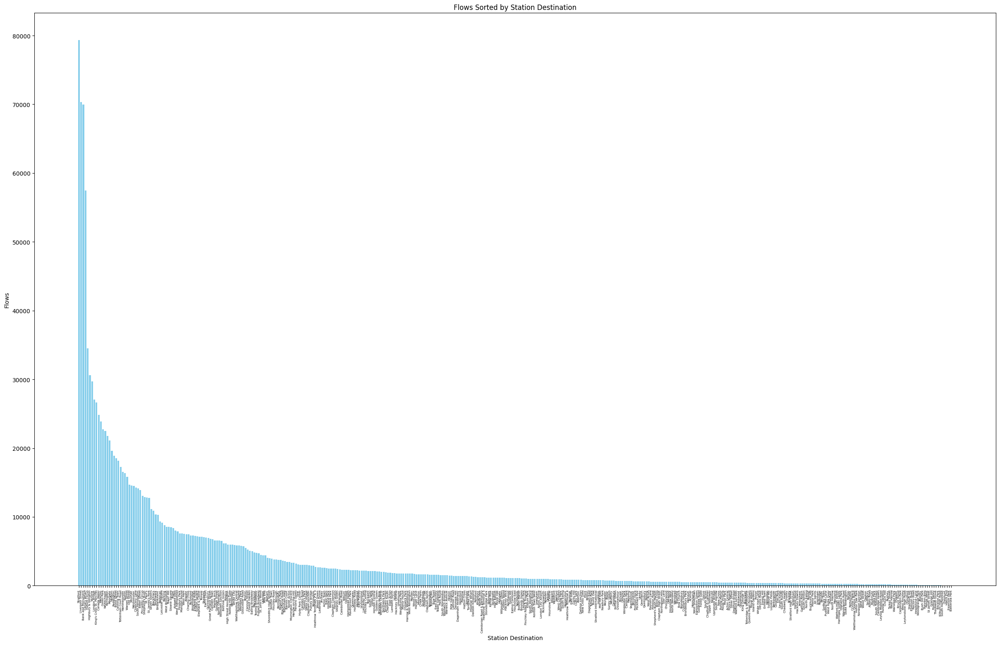

In [134]:
import matplotlib.pyplot as plt

# 创建柱状图
plt.figure(figsize=(30, 18))
plt.bar(df_40_sorted['station_destination'], df_40_sorted['flows'], color='skyblue')
plt.xticks(rotation=90, fontsize=5) 
plt.xlabel('Station Destination')
plt.ylabel('Flows')
plt.title('Flows Sorted by Station Destination')
plt.show()


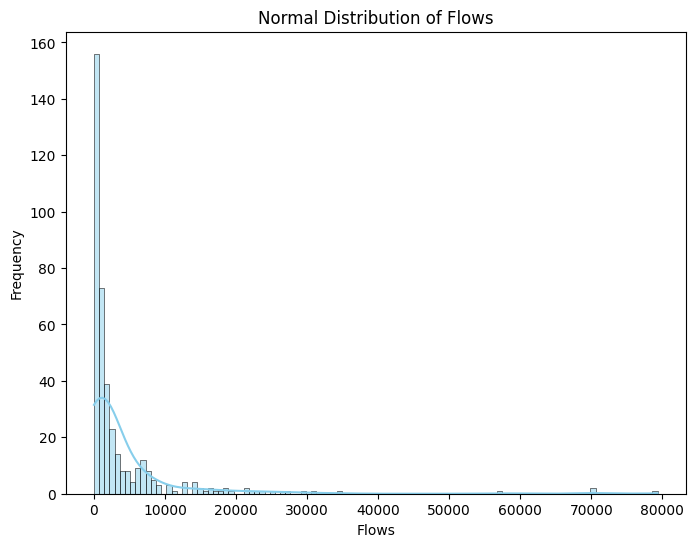

In [135]:
import seaborn as sns

# 绘制正态分布图
plt.figure(figsize=(8, 6))
sns.histplot(df_40_sorted['flows'], kde=True, color='skyblue')
plt.xlabel('Flows')
plt.ylabel('Frequency')
plt.title('Normal Distribution of Flows')
plt.show()


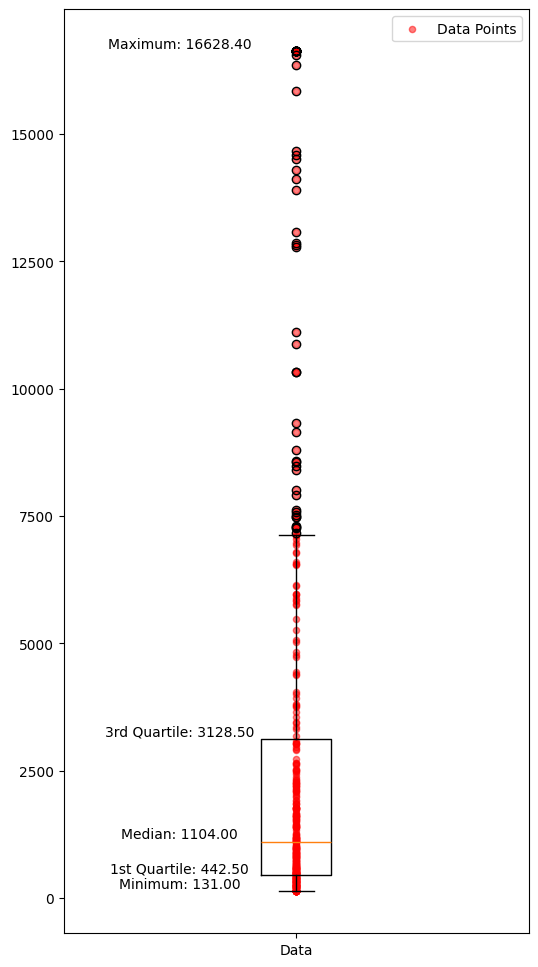

In [156]:

data_40 = df_40_sorted['flows']

p1 = np.percentile(data_40, 5)
p99 = np.percentile(data_40, 95)

data_clipped_40 = np.clip(data_40, p1, p99)

plt.figure(figsize=(6,12))

plt.boxplot(data_clipped_40, vert=True)  # vert=True 表示竖向箱线图

x_coordinates = np.ones(len(data_clipped_40))

plt.scatter(x_coordinates, data_clipped_40, color='red', marker='o', s=20, label='Data Points', alpha=0.5)

plt.xticks([1], ['Data'])

plt.legend()

plt.text(0.75, min(data_clipped_40), f'Minimum: {min(data_clipped_40):.2f}', va='bottom', ha='center')
plt.text(0.75, np.percentile(data_clipped_40, 25), f'1st Quartile: {np.percentile(data_clipped_40, 25):.2f}', va='bottom', ha='center')
plt.text(0.75, np.median(data_clipped_40), f'Median: {np.median(data_clipped_40):.2f}', va='bottom', ha='center')
plt.text(0.75, np.percentile(data_clipped_40, 75), f'3rd Quartile: {np.percentile(data_clipped_40, 75):.2f}', va='bottom', ha='center')
plt.text(0.75, max(data_clipped_40), f'Maximum: {max(data_clipped_40):.2f}', va='bottom', ha='center')

plt.show()


### IV.1. 

In [83]:
flows_3.head(5)

,station_origin,station_destination,flows,population,jobs,distance,population_positive,log_population,jobs_positive,log_jobs,distance_positive,log_distance,unconstrainedEst2,fitted,O_i,D_j,alpha_i,prodsimest1
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,599.0,6.395262,78549.0,11.271478,8131.525097,9.003504,46,46.403008,599,78549,-3.71827,143.0
1,Abbey Road,Beckton,1,599,442,8510.121774,599.0,6.395262,442.0,6.091310,8510.121774,9.049012,1,0.621231,599,442,-3.71827,2.0
2,Abbey Road,Blackwall,3,599,665,3775.448872,599.0,6.395262,665.0,6.499787,3775.448872,8.236275,1,0.925527,599,665,-3.71827,3.0
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,599.0,6.395262,58772.0,10.981421,5086.514220,8.534348,38,37.711347,599,58772,-3.71827,116.0
4,Abbey Road,Canning Town,37,599,15428,2228.923167,599.0,6.395262,15428.0,9.643939,2228.923167,7.709274,13,13.154986,599,15428,-3.71827,41.0


In [84]:

pd.set_option('display.max_columns', None)

check_1 = flows_3[(flows_3["station_destination"] == "Canary Wharf") & (flows_3["jobs"] == 58772)]
check_1.shape # (305, 18)
check_1.head(5)

,station_origin,station_destination,flows,population,jobs,distance,population_positive,log_population,jobs_positive,log_jobs,distance_positive,log_distance,unconstrainedEst2,fitted,O_i,D_j,alpha_i,prodsimest1
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,599.0,6.395262,58772.0,10.981421,5086.514220,8.534348,38,37.711347,599,58772,-3.718270,116.0
126,Acton Town,Canary Wharf,57,3745,58772,20398.165882,3745.0,8.228177,58772.0,10.981421,20398.165882,9.923200,151,151.472104,3745,58772,-3.585502,121.0
348,Aldgate,Canary Wharf,1,2886,58772,6564.419680,2886.0,7.967627,58772.0,10.981421,6564.419680,8.789419,133,133.017617,2886,58772,-3.921088,93.0
595,Aldgate East,Canary Wharf,3,3172,58772,5127.998899,3172.0,8.062118,58772.0,10.981421,5127.998899,8.542471,146,146.233445,3172,58772,-3.840199,103.0
817,All Saints,Canary Wharf,67,740,58772,1340.088733,740.0,6.606650,58772.0,10.981421,1340.088733,7.200491,49,49.323059,740,58772,-3.570189,148.0


In [85]:
flows_41 = flows_3.copy()

In [86]:
def new_sal(row):
    if row["station_destination"] == "Canary Wharf":
        val = 58772/2
    else:
        val = row["jobs"]
    return val
        
flows_41["changed_jobs"] = flows_41.apply(new_sal, axis =1)
flows_41.head(5)

,station_origin,station_destination,flows,population,jobs,distance,population_positive,log_population,jobs_positive,log_jobs,distance_positive,log_distance,unconstrainedEst2,fitted,O_i,D_j,alpha_i,prodsimest1,changed_jobs
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,599.0,6.395262,78549.0,11.271478,8131.525097,9.003504,46,46.403008,599,78549,-3.71827,143.0,78549.0
1,Abbey Road,Beckton,1,599,442,8510.121774,599.0,6.395262,442.0,6.091310,8510.121774,9.049012,1,0.621231,599,442,-3.71827,2.0,442.0
2,Abbey Road,Blackwall,3,599,665,3775.448872,599.0,6.395262,665.0,6.499787,3775.448872,8.236275,1,0.925527,599,665,-3.71827,3.0,665.0
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,599.0,6.395262,58772.0,10.981421,5086.514220,8.534348,38,37.711347,599,58772,-3.71827,116.0,29386.0
4,Abbey Road,Canning Town,37,599,15428,2228.923167,599.0,6.395262,15428.0,9.643939,2228.923167,7.709274,13,13.154986,599,15428,-3.71827,41.0,15428.0


In [87]:
flows_41["prodsimest2"] = np.exp(flows_41["alpha_i"] + gamma*np.log(flows_41["changed_jobs"]) - beta*flows_41["log_distance"])
flows_41["prodsimest2"] = round(flows_41["prodsimest2"],0)

c:\Users\avb19\AppData\Local\Programs\Python\Python312\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [88]:
flows_41.head(5)

,station_origin,station_destination,flows,population,jobs,distance,population_positive,log_population,jobs_positive,log_jobs,distance_positive,log_distance,unconstrainedEst2,fitted,O_i,D_j,alpha_i,prodsimest1,changed_jobs,prodsimest2
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,599.0,6.395262,78549.0,11.271478,8131.525097,9.003504,46,46.403008,599,78549,-3.71827,143.0,78549.0,143.0
1,Abbey Road,Beckton,1,599,442,8510.121774,599.0,6.395262,442.0,6.091310,8510.121774,9.049012,1,0.621231,599,442,-3.71827,2.0,442.0,2.0
2,Abbey Road,Blackwall,3,599,665,3775.448872,599.0,6.395262,665.0,6.499787,3775.448872,8.236275,1,0.925527,599,665,-3.71827,3.0,665.0,3.0
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,599.0,6.395262,58772.0,10.981421,5086.514220,8.534348,38,37.711347,599,58772,-3.71827,116.0,29386.0,66.0
4,Abbey Road,Canning Town,37,599,15428,2228.923167,599.0,6.395262,15428.0,9.643939,2228.923167,7.709274,13,13.154986,599,15428,-3.71827,41.0,15428.0,41.0


In [89]:
# now we can convert the pivot table into a matrix 
flows_41_mat_1 = flows_41.pivot_table(values ="prodsimest2", index="station_origin", columns = "station_destination",
                            aggfunc=np.sum, margins=True)
flows_41_mat_1

C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\2927778744.py:3: FutureWarning: The provided callable <function sum at 0x000002917FE94860> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  flows_41_mat_1 = flows_41.pivot_table(values ="prodsimest2", index="station_origin", columns = "station_destination",
C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\2927778744.py:3: FutureWarning: The provided callable <function sum at 0x000002917FE94860> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  flows_41_mat_1 = flows_41.pivot_table(values ="prodsimest2", index="station_origin", columns = "station_destination",
C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\2927778744.py:3: FutureWarning: The provided callable <function sum at 0x000002

station_destination,Abbey Road,Acton Central,Acton Town,Aldgate,Aldgate East,All Saints,Alperton,Amersham,Anerley,Angel,Archway,Arnos Grove,Arsenal,Baker Street,Balham,Bank and Monument,Barbican,Barking,Barkingside,Barons Court,Battersea Park,Bayswater,Beckton,Beckton Park,Becontree,Belsize Park,Bermondsey,Bethnal Green,Blackfriars,Blackhorse Road,Blackwall,Bond Street,Borough,Boston Manor,Bounds Green,Bow Church,Bow Road,Brent Cross,Brentwood,Brixton,Brockley,Bromley-by-Bow,Brondesbury,Brondesbury Park,Bruce Grove,Buckhurst Hill,Burnt Oak,Bush Hill Park,Bushey,Caledonian Road,Caledonian Road & Barnsbury,Cambridge Heath,Camden Road,Camden Town,Canada Water,Canary Wharf,Canning Town,Cannon Street,Canonbury,Canons Park,Carpenders Park,Chadwell Heath,Chalfont & Latimer,Chalk Farm,Chancery Lane,Charing Cross,Chesham,Cheshunt,Chigwell,Chingford,Chiswick Park,Chorleywood,Clapham Common,Clapham High Street,Clapham Junction,Clapham North,Clapham South,Clapton,Cockfosters,Colindale,Colliers Wood,Covent Garden,Crossharbour,Crouch Hill,Croxley,Crystal Palace,Custom House,Cutty Sark,Cyprus,Dagenham East,Dagenham Heathway,Dalston Junction,Dalston Kingsland,Debden,Denmark Hill,Deptford Bridge,Devons Road,Dollis Hill,Ealing Broadway,Ealing Common,Earl's Court,East Acton,East Finchley,East Ham,East India,East Putney,Eastcote,Edgware,Edgware Road,Edmonton Green,Elephant & Castle,Elm Park,Elverson Road,Embankment,Emerson Park,Enfield Town,Epping,Euston,Euston Square,Fairlop,Farringdon,Finchley Central,Finchley Road,Finchley Road & Frognal,Finsbury Park,Forest Gate,Forest Hill,Fulham Broadway,Gallions Reach,Gants Hill,Gidea Park,Gloucester Road,Golders Green,Goldhawk Road,Goodge Street,Goodmayes,Gospel Oak,Grange Hill,Great Portland Street,Green Park,Greenford,Greenwich,Gunnersbury,Hackney Central,Hackney Downs,Hackney Wick,Haggerston,Hainault,Hammersmith,Hampstead,Hampstead Heath,Hanger Lane,Harlesden,Harold Wood,Harringay Green Lanes,Harrow & Wealdstone,Harrow-on-the-Hill,Hatch End,Hatton Cross,Headstone Lane,Heathrow Terminal 4,Heathrow Terminal 5,Heathrow Terminals 2 & 3,Hendon Central,Heron Quays,High Barnet,High Street Kensington,Highams Park,Highbury & Islington,Highgate,Hillingdon,Holborn,Holland Park,Holloway Road,Homerton,Honor Oak Park,Hornchurch,Hounslow Central,Hounslow East,Hounslow West,Hoxton,Hyde Park Corner,Ickenham,Ilford,Imperial Wharf,Island Gardens,Kennington,Kensal Green,Kensal Rise,Kensington,Kentish Town,Kentish Town West,Kenton,Kew Gardens,Kilburn,Kilburn High Road,Kilburn Park,King George V,King's Cross St. Pancras,Kingsbury,Knightsbridge,Ladbroke Grove,Lambeth North,Lancaster Gate,Langdon Park,Latimer Road,Leicester Square,Lewisham,Leyton,Leyton Midland Road,Leytonstone,Leytonstone High Road,Limehouse,Liverpool Street,London Bridge,London City Airport,London Fields,Loughton,Maida Vale,Manor House,Manor Park,Mansion House,Marble Arch,Maryland,Marylebone,Mile End,Mill Hill East,Moor Park,Moorgate,Morden,Mornington Crescent,Mudchute,Neasden,New Cross,New Cross Gate,Newbury Park,North Acton,North Ealing,North Greenwich,North Harrow,North Wembley,Northfields,Northolt,Northwick Park,Northwood,Northwood Hills,Norwood Junction,Notting Hill Gate,Oakwood,Old Street,Osterley,Oval,Oxford Circus,Paddington,Park Royal,Parsons Green,Peckham Rye,Penge West,Perivale,Piccadilly Circus,Pimlico,Pinner,Plaistow,Pontoon Dock,Poplar,Preston Road,Prince Regent,Pudding Mill Lane,Putney Bridge,Queen's Park,Queens Road Peckham,Queensbury,Queensway,Ravenscourt Park,Rayners Lane,Rectory Road,Redbridge,Regent's Park,Richmond,Rickmansworth,Roding Valley,Romford,Rotherhithe,Royal Albert,Royal Oak,Royal Victoria,Ruislip,Ruislip Gardens,Ruislip Manor,Russell Square,Seven Kings,Seven Sisters,Shadwell,Shenfield,Shepherd's Bush,Shepherd's Bush Market,Shoreditch High Street,Silver Street,Sloane Square,Snaresbrook,South Acton,South Ealing,South Hampstead,South Harrow,South Kensington,South Kenton,South Quay,South Ruislip,South Tottenham,South Wimbledon,Sou

In [90]:
value_new_CW = flows_41_mat_1.loc['All', 'Canary Wharf']
value_new_CW

32434.0

In [92]:
# The previous parameters
alpha_i = prodSim.params[0:-2]
gamma = prodSim.params[-2]
beta = -prodSim.params[-1]

C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\3461204576.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  gamma = prodSim.params[-2]
C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\3461204576.py:4: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  beta = -prodSim.params[-1]


In [93]:
beta

0.06901875039260541

In [94]:
flows_41.head(5)

,station_origin,station_destination,flows,population,jobs,distance,population_positive,log_population,jobs_positive,log_jobs,distance_positive,log_distance,unconstrainedEst2,fitted,O_i,D_j,alpha_i,prodsimest1,changed_jobs,prodsimest2
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,599.0,6.395262,78549.0,11.271478,8131.525097,9.003504,46,46.403008,599,78549,-3.71827,143.0,78549.0,143.0
1,Abbey Road,Beckton,1,599,442,8510.121774,599.0,6.395262,442.0,6.091310,8510.121774,9.049012,1,0.621231,599,442,-3.71827,2.0,442.0,2.0
2,Abbey Road,Blackwall,3,599,665,3775.448872,599.0,6.395262,665.0,6.499787,3775.448872,8.236275,1,0.925527,599,665,-3.71827,3.0,665.0,3.0
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,599.0,6.395262,58772.0,10.981421,5086.514220,8.534348,38,37.711347,599,58772,-3.71827,116.0,29386.0,66.0
4,Abbey Road,Canning Town,37,599,15428,2228.923167,599.0,6.395262,15428.0,9.643939,2228.923167,7.709274,13,13.154986,599,15428,-3.71827,41.0,15428.0,41.0


In [95]:
#calculate some new wj^alpha and d_ij^beta values

Dj2_gamma = flows_41["jobs"]**gamma
dist_beta = flows_41["distance"]**(-beta)
# type(Dj2_gamma) # pandas.core.series.Series

flows_41["Ai1"] = Dj2_gamma * dist_beta
flows_41.head(5)

,station_origin,station_destination,flows,population,jobs,distance,population_positive,log_population,jobs_positive,log_jobs,distance_positive,log_distance,unconstrainedEst2,fitted,O_i,D_j,alpha_i,prodsimest1,changed_jobs,prodsimest2,Ai1
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,599.0,6.395262,78549.0,11.271478,8131.525097,9.003504,46,46.403008,599,78549,-3.71827,143.0,78549.0,143.0,5894.303403
1,Abbey Road,Beckton,1,599,442,8510.121774,599.0,6.395262,442.0,6.091310,8510.121774,9.049012,1,0.621231,599,442,-3.71827,2.0,442.0,2.0,81.698833
2,Abbey Road,Blackwall,3,599,665,3775.448872,599.0,6.395262,665.0,6.499787,3775.448872,8.236275,1,0.925527,599,665,-3.71827,3.0,665.0,3.0,121.059124
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,599.0,6.395262,58772.0,10.981421,5086.514220,8.534348,38,37.711347,599,58772,-3.71827,116.0,29386.0,66.0,4792.068550
4,Abbey Road,Canning Town,37,599,15428,2228.923167,599.0,6.395262,15428.0,9.643939,2228.923167,7.709274,13,13.154986,599,15428,-3.71827,41.0,15428.0,41.0,1682.009413


In [96]:
#now do the sum over all js bit

A_i = pd.DataFrame(flows_41.groupby(["station_origin"])["Ai1"].agg(np.sum))

#now divide into 1
A_i["Ai1"] = 1/A_i["Ai1"]
A_i.rename(columns={"Ai1":"A_i"}, inplace=True)

C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\3411230237.py:3: FutureWarning: The provided callable <function sum at 0x000002917FE94860> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  A_i = pd.DataFrame(flows_41.groupby(["station_origin"])["Ai1"].agg(np.sum))


In [97]:
#and write the A_i values back into the dataframe
flows_41 = flows_41.merge(A_i, left_on="station_origin", right_index=True, how="left")
flows_41.head(5)

,station_origin,station_destination,flows,population,jobs,distance,population_positive,log_population,jobs_positive,log_jobs,distance_positive,log_distance,unconstrainedEst2,fitted,O_i,D_j,alpha_i,prodsimest1,changed_jobs,prodsimest2,Ai1,A_i
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,599.0,6.395262,78549.0,11.271478,8131.525097,9.003504,46,46.403008,599,78549,-3.71827,143.0,78549.0,143.0,5894.303403,0.000041
1,Abbey Road,Beckton,1,599,442,8510.121774,599.0,6.395262,442.0,6.091310,8510.121774,9.049012,1,0.621231,599,442,-3.71827,2.0,442.0,2.0,81.698833,0.000041
2,Abbey Road,Blackwall,3,599,665,3775.448872,599.0,6.395262,665.0,6.499787,3775.448872,8.236275,1,0.925527,599,665,-3.71827,3.0,665.0,3.0,121.059124,0.000041
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,599.0,6.395262,58772.0,10.981421,5086.514220,8.534348,38,37.711347,599,58772,-3.71827,116.0,29386.0,66.0,4792.068550,0.000041
4,Abbey Road,Canning Town,37,599,15428,2228.923167,599.0,6.395262,15428.0,9.643939,2228.923167,7.709274,13,13.154986,599,15428,-3.71827,41.0,15428.0,41.0,1682.009413,0.000041


In [98]:
#to check everything works, recreate the original estimates
flows_41["prodsimest3"] = flows_41["A_i"]*flows_41["O_i"]*Dj2_gamma*dist_beta
#round
flows_41["prodsimest3"] = round(flows_41["prodsimest3"])
#check
flows_41[["prodsimest1", "prodsimest3"]]

,prodsimest1,prodsimest3
0,143.0,143.0
1,2.0,2.0
2,3.0,3.0
3,116.0,116.0
4,41.0,41.0
...,...,...
61469,140.0,140.0
61470,217.0,217.0
61471,25.0,25.0
61472,50.0,50.0


In [99]:
#calculate some new wj^alpha and d_ij^beta values
Dj3_gamma = flows_41["changed_jobs"]**gamma
#calcualte the first stage of the Ai values
flows_41["Ai1"] = Dj3_gamma * dist_beta
#now do the sum over all js bit
A_i = pd.DataFrame(flows_41.groupby(["station_origin"])["Ai1"].agg(np.sum))
#now divide into 1
A_i["Ai1"] = 1/A_i["Ai1"]
A_i.rename(columns={"Ai1":"A_i2"}, inplace=True)
#and write the A_i values back into the dataframe
flows_41 = flows_41.merge(A_i, left_on="station_origin", right_index=True, how="left")


C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\2393498516.py:6: FutureWarning: The provided callable <function sum at 0x000002917FE94860> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  A_i = pd.DataFrame(flows_41.groupby(["station_origin"])["Ai1"].agg(np.sum))


In [100]:
#to check everything works, recreate the original estimates
flows_41["prodsimest4"] = flows_41["A_i2"]*flows_41["O_i"]*Dj3_gamma*dist_beta
#round
flows_41["prodsimest4"] = round(flows_41["prodsimest4"])

flows_41.head(5)

,station_origin,station_destination,flows,population,jobs,distance,population_positive,log_population,jobs_positive,log_jobs,distance_positive,log_distance,unconstrainedEst2,fitted,O_i,D_j,alpha_i,prodsimest1,changed_jobs,prodsimest2,Ai1,A_i,prodsimest3,A_i2,prodsimest4
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,599.0,6.395262,78549.0,11.271478,8131.525097,9.003504,46,46.403008,599,78549,-3.71827,143.0,78549.0,143.0,5894.303403,0.000041,143.0,0.000044,156.0
1,Abbey Road,Beckton,1,599,442,8510.121774,599.0,6.395262,442.0,6.091310,8510.121774,9.049012,1,0.621231,599,442,-3.71827,2.0,442.0,2.0,81.698833,0.000041,2.0,0.000044,2.0
2,Abbey Road,Blackwall,3,599,665,3775.448872,599.0,6.395262,665.0,6.499787,3775.448872,8.236275,1,0.925527,599,665,-3.71827,3.0,665.0,3.0,121.059124,0.000041,3.0,0.000044,3.0
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,599.0,6.395262,58772.0,10.981421,5086.514220,8.534348,38,37.711347,599,58772,-3.71827,116.0,29386.0,66.0,2704.341674,0.000041,116.0,0.000044,72.0
4,Abbey Road,Canning Town,37,599,15428,2228.923167,599.0,6.395262,15428.0,9.643939,2228.923167,7.709274,13,13.154986,599,15428,-3.71827,41.0,15428.0,41.0,1682.009413,0.000041,41.0,0.000044,45.0


In [101]:
flows_41_mat_2 = flows_41.pivot_table(values ="prodsimest4", index="station_origin", columns = "station_destination",
                            aggfunc=np.sum, margins=True)
flows_41_mat_2

C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\713467483.py:1: FutureWarning: The provided callable <function sum at 0x000002917FE94860> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  flows_41_mat_2 = flows_41.pivot_table(values ="prodsimest4", index="station_origin", columns = "station_destination",
C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\713467483.py:1: FutureWarning: The provided callable <function sum at 0x000002917FE94860> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  flows_41_mat_2 = flows_41.pivot_table(values ="prodsimest4", index="station_origin", columns = "station_destination",
C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\713467483.py:1: FutureWarning: The provided callable <function sum at 0x000002917

station_destination,Abbey Road,Acton Central,Acton Town,Aldgate,Aldgate East,All Saints,Alperton,Amersham,Anerley,Angel,Archway,Arnos Grove,Arsenal,Baker Street,Balham,Bank and Monument,Barbican,Barking,Barkingside,Barons Court,Battersea Park,Bayswater,Beckton,Beckton Park,Becontree,Belsize Park,Bermondsey,Bethnal Green,Blackfriars,Blackhorse Road,Blackwall,Bond Street,Borough,Boston Manor,Bounds Green,Bow Church,Bow Road,Brent Cross,Brentwood,Brixton,Brockley,Bromley-by-Bow,Brondesbury,Brondesbury Park,Bruce Grove,Buckhurst Hill,Burnt Oak,Bush Hill Park,Bushey,Caledonian Road,Caledonian Road & Barnsbury,Cambridge Heath,Camden Road,Camden Town,Canada Water,Canary Wharf,Canning Town,Cannon Street,Canonbury,Canons Park,Carpenders Park,Chadwell Heath,Chalfont & Latimer,Chalk Farm,Chancery Lane,Charing Cross,Chesham,Cheshunt,Chigwell,Chingford,Chiswick Park,Chorleywood,Clapham Common,Clapham High Street,Clapham Junction,Clapham North,Clapham South,Clapton,Cockfosters,Colindale,Colliers Wood,Covent Garden,Crossharbour,Crouch Hill,Croxley,Crystal Palace,Custom House,Cutty Sark,Cyprus,Dagenham East,Dagenham Heathway,Dalston Junction,Dalston Kingsland,Debden,Denmark Hill,Deptford Bridge,Devons Road,Dollis Hill,Ealing Broadway,Ealing Common,Earl's Court,East Acton,East Finchley,East Ham,East India,East Putney,Eastcote,Edgware,Edgware Road,Edmonton Green,Elephant & Castle,Elm Park,Elverson Road,Embankment,Emerson Park,Enfield Town,Epping,Euston,Euston Square,Fairlop,Farringdon,Finchley Central,Finchley Road,Finchley Road & Frognal,Finsbury Park,Forest Gate,Forest Hill,Fulham Broadway,Gallions Reach,Gants Hill,Gidea Park,Gloucester Road,Golders Green,Goldhawk Road,Goodge Street,Goodmayes,Gospel Oak,Grange Hill,Great Portland Street,Green Park,Greenford,Greenwich,Gunnersbury,Hackney Central,Hackney Downs,Hackney Wick,Haggerston,Hainault,Hammersmith,Hampstead,Hampstead Heath,Hanger Lane,Harlesden,Harold Wood,Harringay Green Lanes,Harrow & Wealdstone,Harrow-on-the-Hill,Hatch End,Hatton Cross,Headstone Lane,Heathrow Terminal 4,Heathrow Terminal 5,Heathrow Terminals 2 & 3,Hendon Central,Heron Quays,High Barnet,High Street Kensington,Highams Park,Highbury & Islington,Highgate,Hillingdon,Holborn,Holland Park,Holloway Road,Homerton,Honor Oak Park,Hornchurch,Hounslow Central,Hounslow East,Hounslow West,Hoxton,Hyde Park Corner,Ickenham,Ilford,Imperial Wharf,Island Gardens,Kennington,Kensal Green,Kensal Rise,Kensington,Kentish Town,Kentish Town West,Kenton,Kew Gardens,Kilburn,Kilburn High Road,Kilburn Park,King George V,King's Cross St. Pancras,Kingsbury,Knightsbridge,Ladbroke Grove,Lambeth North,Lancaster Gate,Langdon Park,Latimer Road,Leicester Square,Lewisham,Leyton,Leyton Midland Road,Leytonstone,Leytonstone High Road,Limehouse,Liverpool Street,London Bridge,London City Airport,London Fields,Loughton,Maida Vale,Manor House,Manor Park,Mansion House,Marble Arch,Maryland,Marylebone,Mile End,Mill Hill East,Moor Park,Moorgate,Morden,Mornington Crescent,Mudchute,Neasden,New Cross,New Cross Gate,Newbury Park,North Acton,North Ealing,North Greenwich,North Harrow,North Wembley,Northfields,Northolt,Northwick Park,Northwood,Northwood Hills,Norwood Junction,Notting Hill Gate,Oakwood,Old Street,Osterley,Oval,Oxford Circus,Paddington,Park Royal,Parsons Green,Peckham Rye,Penge West,Perivale,Piccadilly Circus,Pimlico,Pinner,Plaistow,Pontoon Dock,Poplar,Preston Road,Prince Regent,Pudding Mill Lane,Putney Bridge,Queen's Park,Queens Road Peckham,Queensbury,Queensway,Ravenscourt Park,Rayners Lane,Rectory Road,Redbridge,Regent's Park,Richmond,Rickmansworth,Roding Valley,Romford,Rotherhithe,Royal Albert,Royal Oak,Royal Victoria,Ruislip,Ruislip Gardens,Ruislip Manor,Russell Square,Seven Kings,Seven Sisters,Shadwell,Shenfield,Shepherd's Bush,Shepherd's Bush Market,Shoreditch High Street,Silver Street,Sloane Square,Snaresbrook,South Acton,South Ealing,South Hampstead,South Harrow,South Kensington,South Kenton,South Quay,South Ruislip,South Tottenham,South Wimbledon,Sou

In [102]:
import pandas as pd

# 新建一个DataFrame，只包含行名为'All'的行
df_all_41 = flows_41_mat_2.loc[['All']]
# 转置DataFrame，并重命名列
df_transposed_41 = df_all_41.transpose().reset_index()
df_transposed_41.columns = ['station_destination', 'flows']

# 显示转置后的DataFrame
df_41 = df_transposed_41


In [172]:
df_41.head(5)

,station_destination,flows
0,Abbey Road,194.0
1,Acton Central,432.0
2,Acton Town,2077.0
3,Aldgate,5857.0
4,Aldgate East,6364.0


In [176]:
df_41[df_41["station_destination"] == "All"]

,station_destination,flows
399,All,1229347.0


In [173]:
df_41_sorted = df_41.sort_values(by='flows', ascending=False)
df_41_sorted = df_41_sorted.iloc[1:]
df_41_sorted.head(10)

,station_destination,flows
327,Stratford,70526.0
15,Bank and Monument,57944.0
213,Liverpool Street,57784.0
252,Oxford Circus,27644.0
55,Canary Wharf,26661.0
168,Highbury & Islington,25782.0
356,Victoria,21747.0
198,King's Cross St. Pancras,21215.0
54,Canada Water,20784.0
214,London Bridge,20014.0


In [168]:
print(df_41_sorted[df_41_sorted['station_destination'] == "Canary Wharf"])


   station_destination    flows
55        Canary Wharf  26661.0


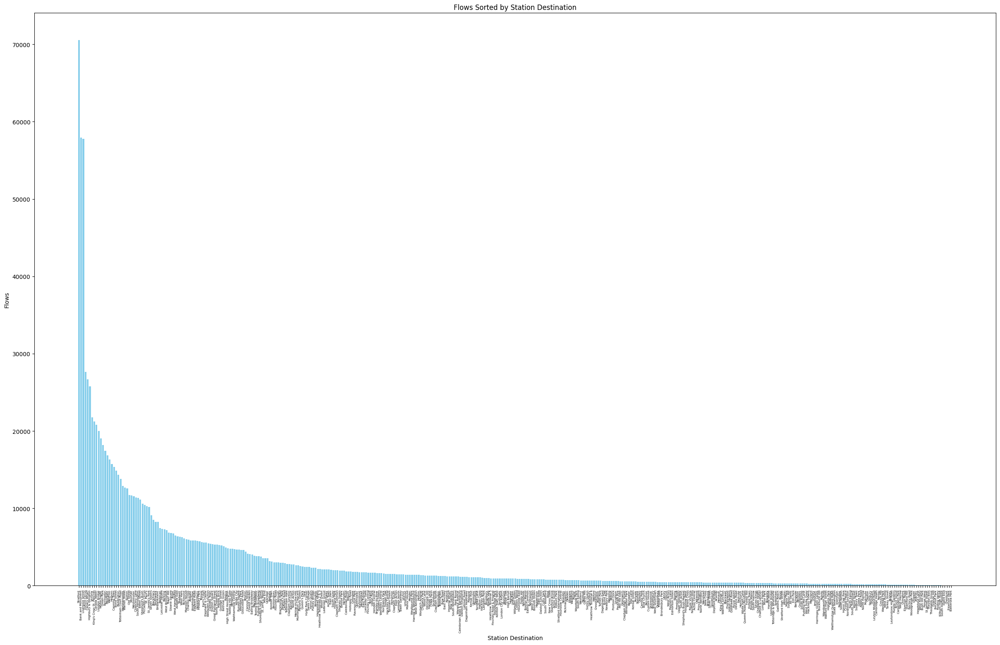

In [148]:
import matplotlib.pyplot as plt

# 创建柱状图
plt.figure(figsize=(30, 18))
plt.bar(df_41_sorted['station_destination'], df_41_sorted['flows'], color='skyblue')
plt.xticks(rotation=90, fontsize=5) 
plt.xlabel('Station Destination')
plt.ylabel('Flows')
plt.title('Flows Sorted by Station Destination')
plt.show()


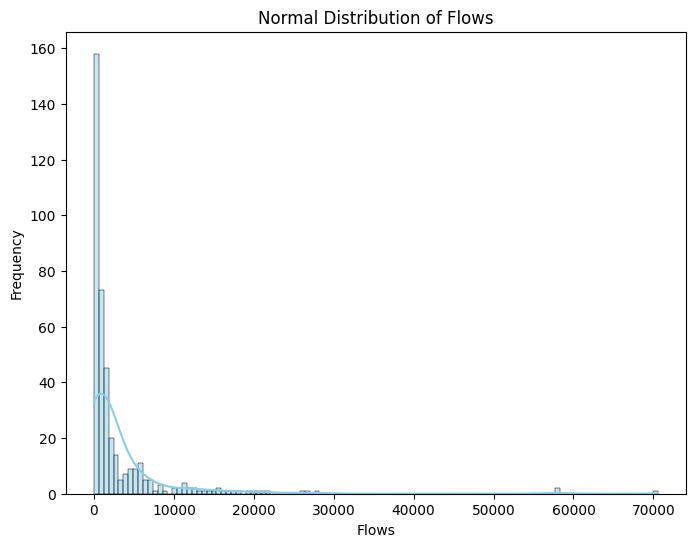

In [139]:
import seaborn as sns

# 绘制正态分布图
plt.figure(figsize=(8, 6))
sns.histplot(df_41_sorted['flows'], kde=True, color='skyblue')
plt.xlabel('Flows')
plt.ylabel('Frequency')
plt.title('Normal Distribution of Flows')
plt.show()


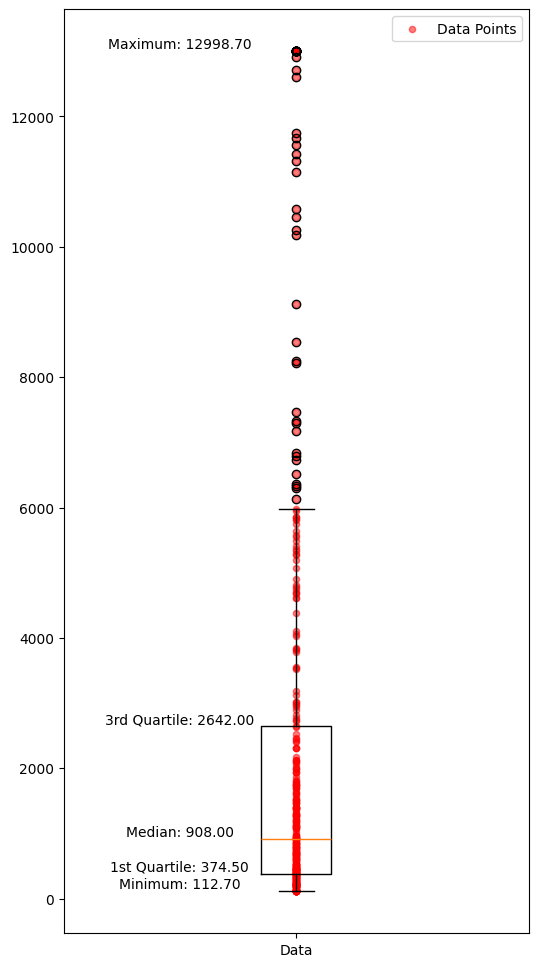

In [157]:

data_41 = df_41_sorted['flows']

p1 = np.percentile(data_41, 5)
p99 = np.percentile(data_41, 95)

data_clipped_41 = np.clip(data_41, p1, p99)

plt.figure(figsize=(6, 12))

plt.boxplot(data_clipped_41, vert=True)  

x_coordinates = np.ones(len(data_clipped_41))

plt.scatter(x_coordinates, data_clipped_41, color='red', marker='o', s=20, label='Data Points', alpha=0.5)

plt.xticks([1], ['Data'])

plt.legend()

plt.text(0.75, min(data_clipped_41), f'Minimum: {min(data_clipped_41):.2f}', va='bottom', ha='center')
plt.text(0.75, np.percentile(data_clipped_41, 25), f'1st Quartile: {np.percentile(data_clipped_41, 25):.2f}', va='bottom', ha='center')
plt.text(0.75, np.median(data_clipped_41), f'Median: {np.median(data_clipped_41):.2f}', va='bottom', ha='center')
plt.text(0.75, np.percentile(data_clipped_41, 75), f'3rd Quartile: {np.percentile(data_clipped_41, 75):.2f}', va='bottom', ha='center')
plt.text(0.75, max(data_clipped_41), f'Maximum: {max(data_clipped_41):.2f}', va='bottom', ha='center')

plt.show()


### IV.2. Scenario B: assume that there is a significant increase in the cost of transport. Select 2 values for the parameter in the cost function reflecting scenario B. Recompute the distribution of flows.


In [105]:
flows_42 = flows_3.copy()
flows_42.head(5)

,station_origin,station_destination,flows,population,jobs,distance,population_positive,log_population,jobs_positive,log_jobs,distance_positive,log_distance,unconstrainedEst2,fitted,O_i,D_j,alpha_i,prodsimest1
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,599.0,6.395262,78549.0,11.271478,8131.525097,9.003504,46,46.403008,599,78549,-3.71827,143.0
1,Abbey Road,Beckton,1,599,442,8510.121774,599.0,6.395262,442.0,6.091310,8510.121774,9.049012,1,0.621231,599,442,-3.71827,2.0
2,Abbey Road,Blackwall,3,599,665,3775.448872,599.0,6.395262,665.0,6.499787,3775.448872,8.236275,1,0.925527,599,665,-3.71827,3.0
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,599.0,6.395262,58772.0,10.981421,5086.514220,8.534348,38,37.711347,599,58772,-3.71827,116.0
4,Abbey Road,Canning Town,37,599,15428,2228.923167,599.0,6.395262,15428.0,9.643939,2228.923167,7.709274,13,13.154986,599,15428,-3.71827,41.0


In [106]:
alpha_i = prodSim.params[0:-2]
gamma = prodSim.params[-2]
beta = -prodSim.params[-1]

C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\1887813951.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  gamma = prodSim.params[-2]
C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\1887813951.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  beta = -prodSim.params[-1]


In [107]:
beta

0.06901875039260541

In [108]:
beta_new = 2 * beta
beta_new

0.13803750078521082

In [109]:
#calculate some new wj^alpha and d_ij^beta values
# 计算一些新的 wj^alpha 和 d_ij^beta 值
Dj4_gamma = flows_42["jobs"]**gamma
dist_beta_new = flows_42["distance"]**(-beta_new)
# type(Dj2_gamma) # pandas.core.series.Series

flows_42["Ai1"] = Dj4_gamma * dist_beta_new
flows_42.head(5)


,station_origin,station_destination,flows,population,jobs,distance,population_positive,log_population,jobs_positive,log_jobs,distance_positive,log_distance,unconstrainedEst2,fitted,O_i,D_j,alpha_i,prodsimest1,Ai1
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,599.0,6.395262,78549.0,11.271478,8131.525097,9.003504,46,46.403008,599,78549,-3.71827,143.0,3166.338206
1,Abbey Road,Beckton,1,599,442,8510.121774,599.0,6.395262,442.0,6.091310,8510.121774,9.049012,1,0.621231,599,442,-3.71827,2.0,43.749853
2,Abbey Road,Blackwall,3,599,665,3775.448872,599.0,6.395262,665.0,6.499787,3775.448872,8.236275,1,0.925527,599,665,-3.71827,3.0,68.567707
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,599.0,6.395262,58772.0,10.981421,5086.514220,8.534348,38,37.711347,599,58772,-3.71827,116.0,2658.952181
4,Abbey Road,Canning Town,37,599,15428,2228.923167,599.0,6.395262,15428.0,9.643939,2228.923167,7.709274,13,13.154986,599,15428,-3.71827,41.0,987.977563


In [110]:
#now do the sum over all js bit
A_i = pd.DataFrame(flows_42.groupby(["station_origin"])["Ai1"].agg(np.sum))
#now divide into 1
A_i["Ai1"] = 1/A_i["Ai1"]
A_i.rename(columns={"Ai1":"A_i_new"}, inplace=True)
#and write the A_i values back into the dataframe
flows_42 = flows_42.merge(A_i, left_on="station_origin", right_index=True, how="left")

C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\499132050.py:2: FutureWarning: The provided callable <function sum at 0x000002917FE94860> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  A_i = pd.DataFrame(flows_42.groupby(["station_origin"])["Ai1"].agg(np.sum))


In [111]:
flows_42.head(5)

,station_origin,station_destination,flows,population,jobs,distance,population_positive,log_population,jobs_positive,log_jobs,distance_positive,log_distance,unconstrainedEst2,fitted,O_i,D_j,alpha_i,prodsimest1,Ai1,A_i_new
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,599.0,6.395262,78549.0,11.271478,8131.525097,9.003504,46,46.403008,599,78549,-3.71827,143.0,3166.338206,0.000071
1,Abbey Road,Beckton,1,599,442,8510.121774,599.0,6.395262,442.0,6.091310,8510.121774,9.049012,1,0.621231,599,442,-3.71827,2.0,43.749853,0.000071
2,Abbey Road,Blackwall,3,599,665,3775.448872,599.0,6.395262,665.0,6.499787,3775.448872,8.236275,1,0.925527,599,665,-3.71827,3.0,68.567707,0.000071
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,599.0,6.395262,58772.0,10.981421,5086.514220,8.534348,38,37.711347,599,58772,-3.71827,116.0,2658.952181,0.000071
4,Abbey Road,Canning Town,37,599,15428,2228.923167,599.0,6.395262,15428.0,9.643939,2228.923167,7.709274,13,13.154986,599,15428,-3.71827,41.0,987.977563,0.000071


In [112]:
#to check everything works, recreate the original estimates
flows_42["prodsimest_newbeta"] = flows_42["A_i_new"]*flows_42["O_i"]*Dj4_gamma*dist_beta_new
#round
flows_42["prodsimest_newbeta"] = round(flows_42["prodsimest_newbeta"])

flows_42.head(5)

,station_origin,station_destination,flows,population,jobs,distance,population_positive,log_population,jobs_positive,log_jobs,distance_positive,log_distance,unconstrainedEst2,fitted,O_i,D_j,alpha_i,prodsimest1,Ai1,A_i_new,prodsimest_newbeta
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,599.0,6.395262,78549.0,11.271478,8131.525097,9.003504,46,46.403008,599,78549,-3.71827,143.0,3166.338206,0.000071,135.0
1,Abbey Road,Beckton,1,599,442,8510.121774,599.0,6.395262,442.0,6.091310,8510.121774,9.049012,1,0.621231,599,442,-3.71827,2.0,43.749853,0.000071,2.0
2,Abbey Road,Blackwall,3,599,665,3775.448872,599.0,6.395262,665.0,6.499787,3775.448872,8.236275,1,0.925527,599,665,-3.71827,3.0,68.567707,0.000071,3.0
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,599.0,6.395262,58772.0,10.981421,5086.514220,8.534348,38,37.711347,599,58772,-3.71827,116.0,2658.952181,0.000071,114.0
4,Abbey Road,Canning Town,37,599,15428,2228.923167,599.0,6.395262,15428.0,9.643939,2228.923167,7.709274,13,13.154986,599,15428,-3.71827,41.0,987.977563,0.000071,42.0


In [113]:
flows_42_mat_1 = flows_42.pivot_table(values ="prodsimest_newbeta", index="station_origin", columns = "station_destination",
                            aggfunc=np.sum, margins=True)
flows_42_mat_1

C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\3933040029.py:1: FutureWarning: The provided callable <function sum at 0x000002917FE94860> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  flows_42_mat_1 = flows_42.pivot_table(values ="prodsimest_newbeta", index="station_origin", columns = "station_destination",
C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\3933040029.py:1: FutureWarning: The provided callable <function sum at 0x000002917FE94860> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  flows_42_mat_1 = flows_42.pivot_table(values ="prodsimest_newbeta", index="station_origin", columns = "station_destination",
C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\3933040029.py:1: FutureWarning: The provided callable <function s

station_destination,Abbey Road,Acton Central,Acton Town,Aldgate,Aldgate East,All Saints,Alperton,Amersham,Anerley,Angel,Archway,Arnos Grove,Arsenal,Baker Street,Balham,Bank and Monument,Barbican,Barking,Barkingside,Barons Court,Battersea Park,Bayswater,Beckton,Beckton Park,Becontree,Belsize Park,Bermondsey,Bethnal Green,Blackfriars,Blackhorse Road,Blackwall,Bond Street,Borough,Boston Manor,Bounds Green,Bow Church,Bow Road,Brent Cross,Brentwood,Brixton,Brockley,Bromley-by-Bow,Brondesbury,Brondesbury Park,Bruce Grove,Buckhurst Hill,Burnt Oak,Bush Hill Park,Bushey,Caledonian Road,Caledonian Road & Barnsbury,Cambridge Heath,Camden Road,Camden Town,Canada Water,Canary Wharf,Canning Town,Cannon Street,Canonbury,Canons Park,Carpenders Park,Chadwell Heath,Chalfont & Latimer,Chalk Farm,Chancery Lane,Charing Cross,Chesham,Cheshunt,Chigwell,Chingford,Chiswick Park,Chorleywood,Clapham Common,Clapham High Street,Clapham Junction,Clapham North,Clapham South,Clapton,Cockfosters,Colindale,Colliers Wood,Covent Garden,Crossharbour,Crouch Hill,Croxley,Crystal Palace,Custom House,Cutty Sark,Cyprus,Dagenham East,Dagenham Heathway,Dalston Junction,Dalston Kingsland,Debden,Denmark Hill,Deptford Bridge,Devons Road,Dollis Hill,Ealing Broadway,Ealing Common,Earl's Court,East Acton,East Finchley,East Ham,East India,East Putney,Eastcote,Edgware,Edgware Road,Edmonton Green,Elephant & Castle,Elm Park,Elverson Road,Embankment,Emerson Park,Enfield Town,Epping,Euston,Euston Square,Fairlop,Farringdon,Finchley Central,Finchley Road,Finchley Road & Frognal,Finsbury Park,Forest Gate,Forest Hill,Fulham Broadway,Gallions Reach,Gants Hill,Gidea Park,Gloucester Road,Golders Green,Goldhawk Road,Goodge Street,Goodmayes,Gospel Oak,Grange Hill,Great Portland Street,Green Park,Greenford,Greenwich,Gunnersbury,Hackney Central,Hackney Downs,Hackney Wick,Haggerston,Hainault,Hammersmith,Hampstead,Hampstead Heath,Hanger Lane,Harlesden,Harold Wood,Harringay Green Lanes,Harrow & Wealdstone,Harrow-on-the-Hill,Hatch End,Hatton Cross,Headstone Lane,Heathrow Terminal 4,Heathrow Terminal 5,Heathrow Terminals 2 & 3,Hendon Central,Heron Quays,High Barnet,High Street Kensington,Highams Park,Highbury & Islington,Highgate,Hillingdon,Holborn,Holland Park,Holloway Road,Homerton,Honor Oak Park,Hornchurch,Hounslow Central,Hounslow East,Hounslow West,Hoxton,Hyde Park Corner,Ickenham,Ilford,Imperial Wharf,Island Gardens,Kennington,Kensal Green,Kensal Rise,Kensington,Kentish Town,Kentish Town West,Kenton,Kew Gardens,Kilburn,Kilburn High Road,Kilburn Park,King George V,King's Cross St. Pancras,Kingsbury,Knightsbridge,Ladbroke Grove,Lambeth North,Lancaster Gate,Langdon Park,Latimer Road,Leicester Square,Lewisham,Leyton,Leyton Midland Road,Leytonstone,Leytonstone High Road,Limehouse,Liverpool Street,London Bridge,London City Airport,London Fields,Loughton,Maida Vale,Manor House,Manor Park,Mansion House,Marble Arch,Maryland,Marylebone,Mile End,Mill Hill East,Moor Park,Moorgate,Morden,Mornington Crescent,Mudchute,Neasden,New Cross,New Cross Gate,Newbury Park,North Acton,North Ealing,North Greenwich,North Harrow,North Wembley,Northfields,Northolt,Northwick Park,Northwood,Northwood Hills,Norwood Junction,Notting Hill Gate,Oakwood,Old Street,Osterley,Oval,Oxford Circus,Paddington,Park Royal,Parsons Green,Peckham Rye,Penge West,Perivale,Piccadilly Circus,Pimlico,Pinner,Plaistow,Pontoon Dock,Poplar,Preston Road,Prince Regent,Pudding Mill Lane,Putney Bridge,Queen's Park,Queens Road Peckham,Queensbury,Queensway,Ravenscourt Park,Rayners Lane,Rectory Road,Redbridge,Regent's Park,Richmond,Rickmansworth,Roding Valley,Romford,Rotherhithe,Royal Albert,Royal Oak,Royal Victoria,Ruislip,Ruislip Gardens,Ruislip Manor,Russell Square,Seven Kings,Seven Sisters,Shadwell,Shenfield,Shepherd's Bush,Shepherd's Bush Market,Shoreditch High Street,Silver Street,Sloane Square,Snaresbrook,South Acton,South Ealing,South Hampstead,South Harrow,South Kensington,South Kenton,South Quay,South Ruislip,South Tottenham,South Wimbledon,Sou

In [114]:
import pandas as pd

# 新建一个DataFrame，只包含行名为'All'的行
df_all_42 = flows_42_mat_1.loc[['All']]
# 转置DataFrame，并重命名列
df_transposed_42 = df_all_42.transpose().reset_index()
df_transposed_42.columns = ['station_destination', 'flows']

# 显示转置后的DataFrame
df_42 = df_transposed_42


In [115]:
df_42.head(5)

,station_destination,flows
0,Abbey Road,188.0
1,Acton Central,419.0
2,Acton Town,2000.0
3,Aldgate,5819.0
4,Aldgate East,6357.0


In [175]:
df_42[df_42["station_destination"] == "All"]

,station_destination,flows
399,All,1229364.0


In [174]:
df_42_sorted = df_42.sort_values(by='flows', ascending=False)
df_42_sorted = df_42_sorted.iloc[1:]
df_42_sorted.head(10)

,station_destination,flows
327,Stratford,68770.0
213,Liverpool Street,57444.0
15,Bank and Monument,56217.0
55,Canary Wharf,45785.0
252,Oxford Circus,27664.0
168,Highbury & Islington,25610.0
356,Victoria,21661.0
198,King's Cross St. Pancras,21199.0
54,Canada Water,20779.0
214,London Bridge,20002.0


In [166]:
print(df_42_sorted[df_42_sorted['station_destination'] == "Canary Wharf"])


   station_destination    flows
55        Canary Wharf  45785.0


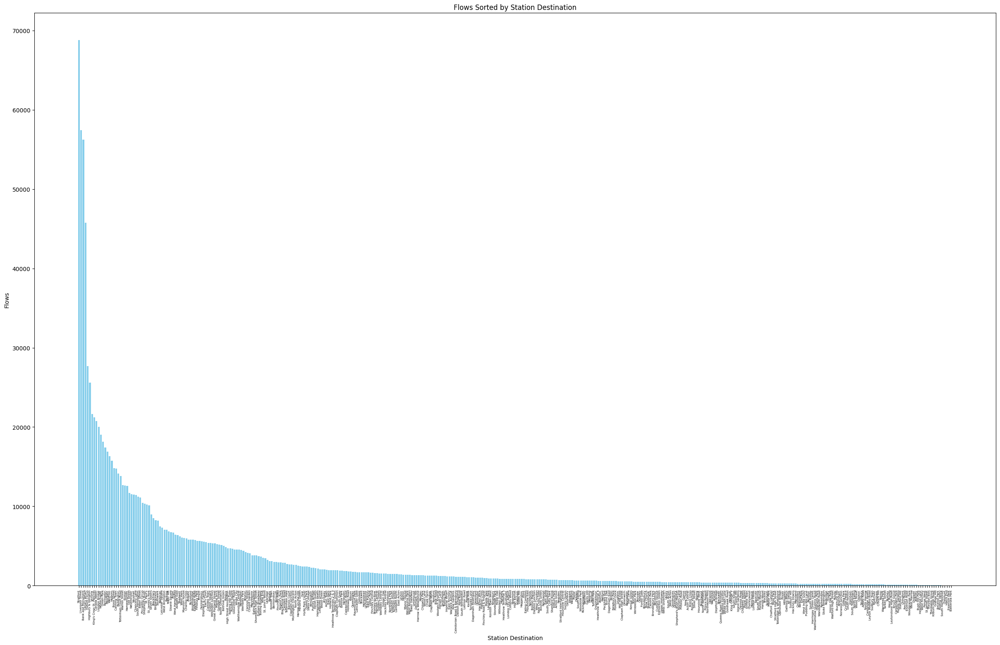

In [158]:
import matplotlib.pyplot as plt

# 创建柱状图
plt.figure(figsize=(30, 18))
plt.bar(df_42_sorted['station_destination'], df_42_sorted['flows'], color='skyblue')
plt.xticks(rotation=90, fontsize=5) 
plt.xlabel('Station Destination')
plt.ylabel('Flows')
plt.title('Flows Sorted by Station Destination')
plt.show()


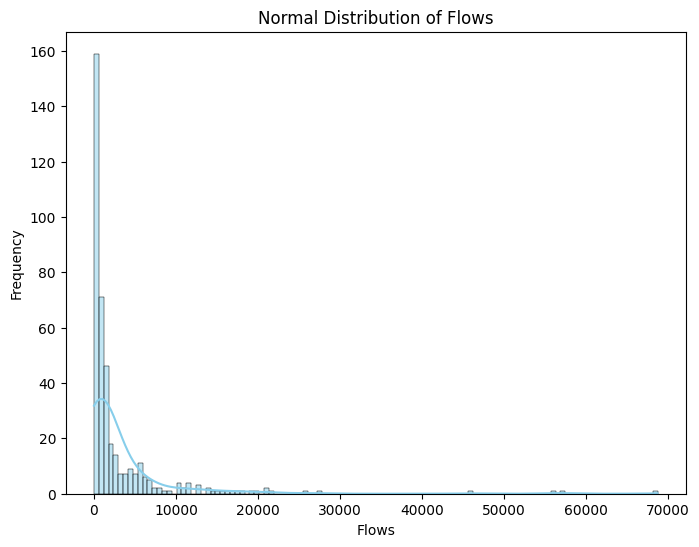

In [118]:
import seaborn as sns

# 绘制正态分布图
plt.figure(figsize=(8, 6))
sns.histplot(df_42_sorted['flows'], kde=True, color='skyblue')
plt.xlabel('Flows')
plt.ylabel('Frequency')
plt.title('Normal Distribution of Flows')
plt.show()


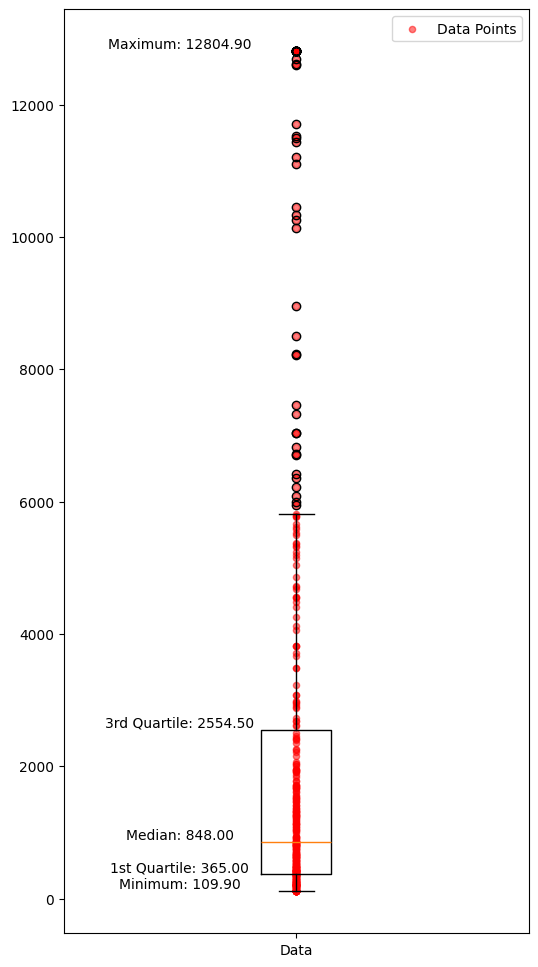

In [160]:

data = df_42_sorted['flows']

p1 = np.percentile(data, 5)
p99 = np.percentile(data, 95)

data_clipped = np.clip(data, p1, p99)

plt.figure(figsize=(6, 12))

plt.boxplot(data_clipped, vert=True)  

x_coordinates = np.ones(len(data_clipped))

plt.scatter(x_coordinates, data_clipped, color='red', marker='o', s=20, label='Data Points', alpha=0.5)

plt.xticks([1], ['Data'])

plt.legend()

plt.text(0.75, min(data_clipped), f'Minimum: {min(data_clipped):.2f}', va='bottom', ha='center')
plt.text(0.75, np.percentile(data_clipped, 25), f'1st Quartile: {np.percentile(data_clipped, 25):.2f}', va='bottom', ha='center')
plt.text(0.75, np.median(data_clipped), f'Median: {np.median(data_clipped):.2f}', va='bottom', ha='center')
plt.text(0.75, np.percentile(data_clipped, 75), f'3rd Quartile: {np.percentile(data_clipped, 75):.2f}', va='bottom', ha='center')
plt.text(0.75, max(data_clipped), f'Maximum: {max(data_clipped):.2f}', va='bottom', ha='center')

plt.show()

### IV.2. Scenario B: assume that there is a significant increase in the cost of transport. Select 2 values for the parameter in the cost function reflecting scenario B. Recompute the distribution of flows.

In [235]:
flows_42U = flows_3.copy()
flows_42U.head(5)

,station_origin,station_destination,flows,population,jobs,distance,population_positive,log_population,jobs_positive,log_jobs,distance_positive,log_distance,unconstrainedEst2,fitted,O_i,D_j,alpha_i,prodsimest1
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,599.0,6.395262,78549.0,11.271478,8131.525097,9.003504,46,46.403008,599,78549,-3.71827,143.0
1,Abbey Road,Beckton,1,599,442,8510.121774,599.0,6.395262,442.0,6.091310,8510.121774,9.049012,1,0.621231,599,442,-3.71827,2.0
2,Abbey Road,Blackwall,3,599,665,3775.448872,599.0,6.395262,665.0,6.499787,3775.448872,8.236275,1,0.925527,599,665,-3.71827,3.0
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,599.0,6.395262,58772.0,10.981421,5086.514220,8.534348,38,37.711347,599,58772,-3.71827,116.0
4,Abbey Road,Canning Town,37,599,15428,2228.923167,599.0,6.395262,15428.0,9.643939,2228.923167,7.709274,13,13.154986,599,15428,-3.71827,41.0


In [236]:
alpha_i_U = prodSim.params[0:-2]
gamma_U = prodSim.params[-2]
beta_U = -prodSim.params[-1]

C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\4190196857.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  gamma_U = prodSim.params[-2]
C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\4190196857.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  beta_U = -prodSim.params[-1]


In [237]:
gamma_U

0.8253711083974281

In [238]:
beta_U

0.06901875039260541

In [239]:
beta_ultra = 10 * beta_U
beta_ultra

0.6901875039260541

In [240]:
#calculate some new wj^alpha and d_ij^beta values

Dju_gamma = flows_42U["jobs"]**gamma
dist_beta_ultra = flows_42U["distance"]**(-beta_ultra)
# type(Dj2_gamma) # pandas.core.series.Series

flows_42U["Ai1"] = Dju_gamma * dist_beta_ultra
flows_42U.head(5)


,station_origin,station_destination,flows,population,jobs,distance,population_positive,log_population,jobs_positive,log_jobs,distance_positive,log_distance,unconstrainedEst2,fitted,O_i,D_j,alpha_i,prodsimest1,Ai1
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,599.0,6.395262,78549.0,11.271478,8131.525097,9.003504,46,46.403008,599,78549,-3.71827,143.0,21.956131
1,Abbey Road,Beckton,1,599,442,8510.121774,599.0,6.395262,442.0,6.091310,8510.121774,9.049012,1,0.621231,599,442,-3.71827,2.0,0.295844
2,Abbey Road,Blackwall,3,599,665,3775.448872,599.0,6.395262,665.0,6.499787,3775.448872,8.236275,1,0.925527,599,665,-3.71827,3.0,0.726267
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,599.0,6.395262,58772.0,10.981421,5086.514220,8.534348,38,37.711347,599,58772,-3.71827,116.0,23.889693
4,Abbey Road,Canning Town,37,599,15428,2228.923167,599.0,6.395262,15428.0,9.643939,2228.923167,7.709274,13,13.154986,599,15428,-3.71827,41.0,13.998979


In [241]:
#now do the sum over all js bit
A_i_U = pd.DataFrame(flows_42U.groupby(["station_origin"])["Ai1"].agg(np.sum))
#now divide into 1
A_i_U["Ai1"] = 1/A_i_U["Ai1"]
A_i_U.rename(columns={"Ai1":"A_i_ultra"}, inplace=True)
#and write the A_i values back into the dataframe
flows_42U = flows_42U.merge(A_i_U, left_on="station_origin", right_index=True, how="left")

C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\1595934689.py:2: FutureWarning: The provided callable <function sum at 0x000002917FE94860> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  A_i_U = pd.DataFrame(flows_42U.groupby(["station_origin"])["Ai1"].agg(np.sum))


In [242]:
flows_42U.head(5)

,station_origin,station_destination,flows,population,jobs,distance,population_positive,log_population,jobs_positive,log_jobs,distance_positive,log_distance,unconstrainedEst2,fitted,O_i,D_j,alpha_i,prodsimest1,Ai1,A_i_ultra
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,599.0,6.395262,78549.0,11.271478,8131.525097,9.003504,46,46.403008,599,78549,-3.71827,143.0,21.956131,0.005807
1,Abbey Road,Beckton,1,599,442,8510.121774,599.0,6.395262,442.0,6.091310,8510.121774,9.049012,1,0.621231,599,442,-3.71827,2.0,0.295844,0.005807
2,Abbey Road,Blackwall,3,599,665,3775.448872,599.0,6.395262,665.0,6.499787,3775.448872,8.236275,1,0.925527,599,665,-3.71827,3.0,0.726267,0.005807
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,599.0,6.395262,58772.0,10.981421,5086.514220,8.534348,38,37.711347,599,58772,-3.71827,116.0,23.889693,0.005807
4,Abbey Road,Canning Town,37,599,15428,2228.923167,599.0,6.395262,15428.0,9.643939,2228.923167,7.709274,13,13.154986,599,15428,-3.71827,41.0,13.998979,0.005807


In [243]:
#to check everything works, recreate the original estimates
flows_42U["prodsimest_ultrabeta"] = flows_42U["A_i_ultra"]*flows_42U["O_i"]*Dju_gamma*dist_beta_ultra
#round
flows_42U["prodsimest_ultrabeta"] = round(flows_42U["prodsimest_ultrabeta"])

flows_42U.head(5)

,station_origin,station_destination,flows,population,jobs,distance,population_positive,log_population,jobs_positive,log_jobs,distance_positive,log_distance,unconstrainedEst2,fitted,O_i,D_j,alpha_i,prodsimest1,Ai1,A_i_ultra,prodsimest_ultrabeta
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,599.0,6.395262,78549.0,11.271478,8131.525097,9.003504,46,46.403008,599,78549,-3.71827,143.0,21.956131,0.005807,76.0
1,Abbey Road,Beckton,1,599,442,8510.121774,599.0,6.395262,442.0,6.091310,8510.121774,9.049012,1,0.621231,599,442,-3.71827,2.0,0.295844,0.005807,1.0
2,Abbey Road,Blackwall,3,599,665,3775.448872,599.0,6.395262,665.0,6.499787,3775.448872,8.236275,1,0.925527,599,665,-3.71827,3.0,0.726267,0.005807,3.0
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,599.0,6.395262,58772.0,10.981421,5086.514220,8.534348,38,37.711347,599,58772,-3.71827,116.0,23.889693,0.005807,83.0
4,Abbey Road,Canning Town,37,599,15428,2228.923167,599.0,6.395262,15428.0,9.643939,2228.923167,7.709274,13,13.154986,599,15428,-3.71827,41.0,13.998979,0.005807,49.0


In [244]:
flows_42U_mat_1 = flows_42U.pivot_table(values ="prodsimest_ultrabeta", index="station_origin", columns = "station_destination",
                            aggfunc=np.sum, margins=True)
flows_42U_mat_1

C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\2886769225.py:1: FutureWarning: The provided callable <function sum at 0x000002917FE94860> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  flows_42U_mat_1 = flows_42U.pivot_table(values ="prodsimest_ultrabeta", index="station_origin", columns = "station_destination",
C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\2886769225.py:1: FutureWarning: The provided callable <function sum at 0x000002917FE94860> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  flows_42U_mat_1 = flows_42U.pivot_table(values ="prodsimest_ultrabeta", index="station_origin", columns = "station_destination",
C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\2886769225.py:1: FutureWarning: The provided callable <fu

station_destination,Abbey Road,Acton Central,Acton Town,Aldgate,Aldgate East,All Saints,Alperton,Amersham,Anerley,Angel,Archway,Arnos Grove,Arsenal,Baker Street,Balham,Bank and Monument,Barbican,Barking,Barkingside,Barons Court,Battersea Park,Bayswater,Beckton,Beckton Park,Becontree,Belsize Park,Bermondsey,Bethnal Green,Blackfriars,Blackhorse Road,Blackwall,Bond Street,Borough,Boston Manor,Bounds Green,Bow Church,Bow Road,Brent Cross,Brentwood,Brixton,Brockley,Bromley-by-Bow,Brondesbury,Brondesbury Park,Bruce Grove,Buckhurst Hill,Burnt Oak,Bush Hill Park,Bushey,Caledonian Road,Caledonian Road & Barnsbury,Cambridge Heath,Camden Road,Camden Town,Canada Water,Canary Wharf,Canning Town,Cannon Street,Canonbury,Canons Park,Carpenders Park,Chadwell Heath,Chalfont & Latimer,Chalk Farm,Chancery Lane,Charing Cross,Chesham,Cheshunt,Chigwell,Chingford,Chiswick Park,Chorleywood,Clapham Common,Clapham High Street,Clapham Junction,Clapham North,Clapham South,Clapton,Cockfosters,Colindale,Colliers Wood,Covent Garden,Crossharbour,Crouch Hill,Croxley,Crystal Palace,Custom House,Cutty Sark,Cyprus,Dagenham East,Dagenham Heathway,Dalston Junction,Dalston Kingsland,Debden,Denmark Hill,Deptford Bridge,Devons Road,Dollis Hill,Ealing Broadway,Ealing Common,Earl's Court,East Acton,East Finchley,East Ham,East India,East Putney,Eastcote,Edgware,Edgware Road,Edmonton Green,Elephant & Castle,Elm Park,Elverson Road,Embankment,Emerson Park,Enfield Town,Epping,Euston,Euston Square,Fairlop,Farringdon,Finchley Central,Finchley Road,Finchley Road & Frognal,Finsbury Park,Forest Gate,Forest Hill,Fulham Broadway,Gallions Reach,Gants Hill,Gidea Park,Gloucester Road,Golders Green,Goldhawk Road,Goodge Street,Goodmayes,Gospel Oak,Grange Hill,Great Portland Street,Green Park,Greenford,Greenwich,Gunnersbury,Hackney Central,Hackney Downs,Hackney Wick,Haggerston,Hainault,Hammersmith,Hampstead,Hampstead Heath,Hanger Lane,Harlesden,Harold Wood,Harringay Green Lanes,Harrow & Wealdstone,Harrow-on-the-Hill,Hatch End,Hatton Cross,Headstone Lane,Heathrow Terminal 4,Heathrow Terminal 5,Heathrow Terminals 2 & 3,Hendon Central,Heron Quays,High Barnet,High Street Kensington,Highams Park,Highbury & Islington,Highgate,Hillingdon,Holborn,Holland Park,Holloway Road,Homerton,Honor Oak Park,Hornchurch,Hounslow Central,Hounslow East,Hounslow West,Hoxton,Hyde Park Corner,Ickenham,Ilford,Imperial Wharf,Island Gardens,Kennington,Kensal Green,Kensal Rise,Kensington,Kentish Town,Kentish Town West,Kenton,Kew Gardens,Kilburn,Kilburn High Road,Kilburn Park,King George V,King's Cross St. Pancras,Kingsbury,Knightsbridge,Ladbroke Grove,Lambeth North,Lancaster Gate,Langdon Park,Latimer Road,Leicester Square,Lewisham,Leyton,Leyton Midland Road,Leytonstone,Leytonstone High Road,Limehouse,Liverpool Street,London Bridge,London City Airport,London Fields,Loughton,Maida Vale,Manor House,Manor Park,Mansion House,Marble Arch,Maryland,Marylebone,Mile End,Mill Hill East,Moor Park,Moorgate,Morden,Mornington Crescent,Mudchute,Neasden,New Cross,New Cross Gate,Newbury Park,North Acton,North Ealing,North Greenwich,North Harrow,North Wembley,Northfields,Northolt,Northwick Park,Northwood,Northwood Hills,Norwood Junction,Notting Hill Gate,Oakwood,Old Street,Osterley,Oval,Oxford Circus,Paddington,Park Royal,Parsons Green,Peckham Rye,Penge West,Perivale,Piccadilly Circus,Pimlico,Pinner,Plaistow,Pontoon Dock,Poplar,Preston Road,Prince Regent,Pudding Mill Lane,Putney Bridge,Queen's Park,Queens Road Peckham,Queensbury,Queensway,Ravenscourt Park,Rayners Lane,Rectory Road,Redbridge,Regent's Park,Richmond,Rickmansworth,Roding Valley,Romford,Rotherhithe,Royal Albert,Royal Oak,Royal Victoria,Ruislip,Ruislip Gardens,Ruislip Manor,Russell Square,Seven Kings,Seven Sisters,Shadwell,Shenfield,Shepherd's Bush,Shepherd's Bush Market,Shoreditch High Street,Silver Street,Sloane Square,Snaresbrook,South Acton,South Ealing,South Hampstead,South Harrow,South Kensington,South Kenton,South Quay,South Ruislip,South Tottenham,South Wimbledon,Sou

In [245]:
import pandas as pd

df_all_42U = flows_42U_mat_1.loc[['All']]

df_transposed_42U = df_all_42U.transpose().reset_index()
df_transposed_42U.columns = ['station_destination', 'flows']

df_42U = df_transposed_42U

In [246]:
df_42U.head(5)

,station_destination,flows
0,Abbey Road,281.0
1,Acton Central,346.0
2,Acton Town,1703.0
3,Aldgate,6113.0
4,Aldgate East,6804.0


In [247]:
df_42U[df_42U["station_destination"] == "All"]

,station_destination,flows
399,All,1228972.0


In [248]:
df_42U_sorted = df_42U.sort_values(by='flows', ascending=False)
df_42U_sorted = df_42U_sorted.iloc[1:]
df_42U_sorted.head(10)

,station_destination,flows
327,Stratford,66020.0
213,Liverpool Street,58031.0
15,Bank and Monument,56106.0
55,Canary Wharf,47045.0
252,Oxford Circus,30183.0
168,Highbury & Islington,25541.0
356,Victoria,22893.0
198,King's Cross St. Pancras,22834.0
54,Canada Water,22199.0
214,London Bridge,21848.0


In [249]:
print(df_42U_sorted[df_42U_sorted['station_destination'] == "Canary Wharf"])


   station_destination    flows
55        Canary Wharf  47045.0


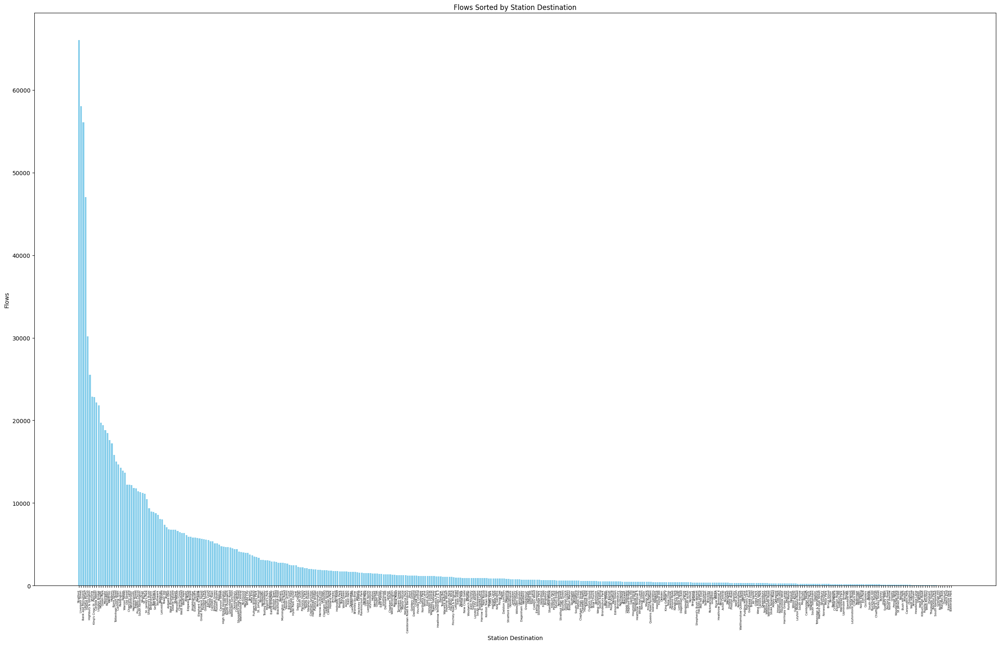

In [250]:
import matplotlib.pyplot as plt

plt.figure(figsize=(30, 18))
plt.bar(df_42U_sorted['station_destination'], df_42U_sorted['flows'], color='skyblue')
plt.xticks(rotation=90, fontsize=5) 
plt.xlabel('Station Destination')
plt.ylabel('Flows')
plt.title('Flows Sorted by Station Destination')
plt.show()


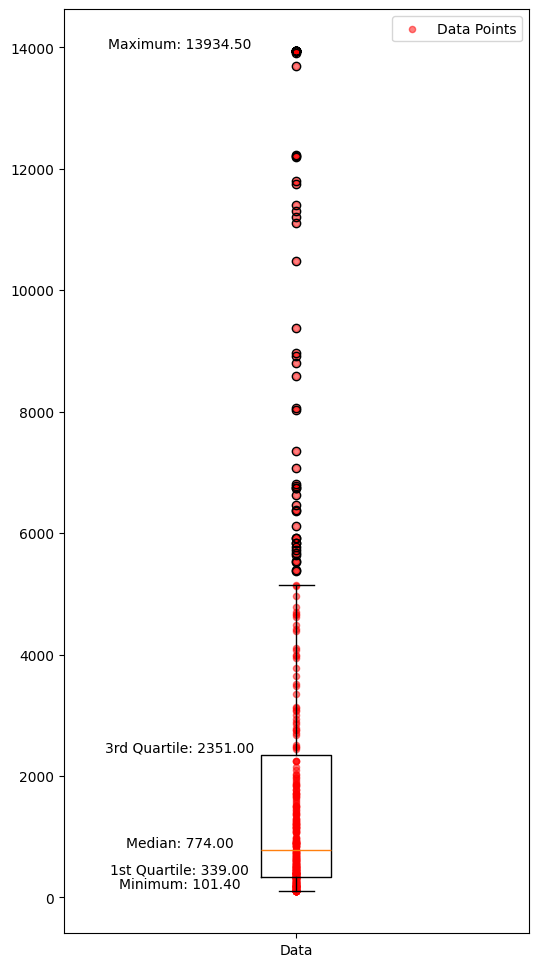

In [251]:

data_U = df_42U_sorted['flows']

p1 = np.percentile(data_U, 5)
p99 = np.percentile(data_U, 95)

data_clipped_U = np.clip(data_U, p1, p99)

plt.figure(figsize=(6, 12))

plt.boxplot(data_clipped_U, vert=True)  

x_coordinates = np.ones(len(data_clipped_U))

plt.scatter(x_coordinates, data_clipped_U, color='red', marker='o', s=20, label='Data Points', alpha=0.5)

plt.xticks([1], ['Data'])

plt.legend()

plt.text(0.75, min(data_clipped_U), f'Minimum: {min(data_clipped_U):.2f}', va='bottom', ha='center')
plt.text(0.75, np.percentile(data_clipped_U, 25), f'1st Quartile: {np.percentile(data_clipped_U, 25):.2f}', va='bottom', ha='center')
plt.text(0.75, np.median(data_clipped_U), f'Median: {np.median(data_clipped_U):.2f}', va='bottom', ha='center')
plt.text(0.75, np.percentile(data_clipped_U, 75), f'3rd Quartile: {np.percentile(data_clipped_U, 75):.2f}', va='bottom', ha='center')
plt.text(0.75, max(data_clipped_U), f'Maximum: {max(data_clipped_U):.2f}', va='bottom', ha='center')

plt.show()


### IV.3. Discuss how the flows change for the 3 different situations: scenario A, and scenario B with two selections of parameters. Which scenario would have more impact in the redistribution of flows? Explain and justify your answers using the results of the analysis.

C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\260601709.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_flows = flows_41.groupby('distance_group')['flows'].sum().reset_index()


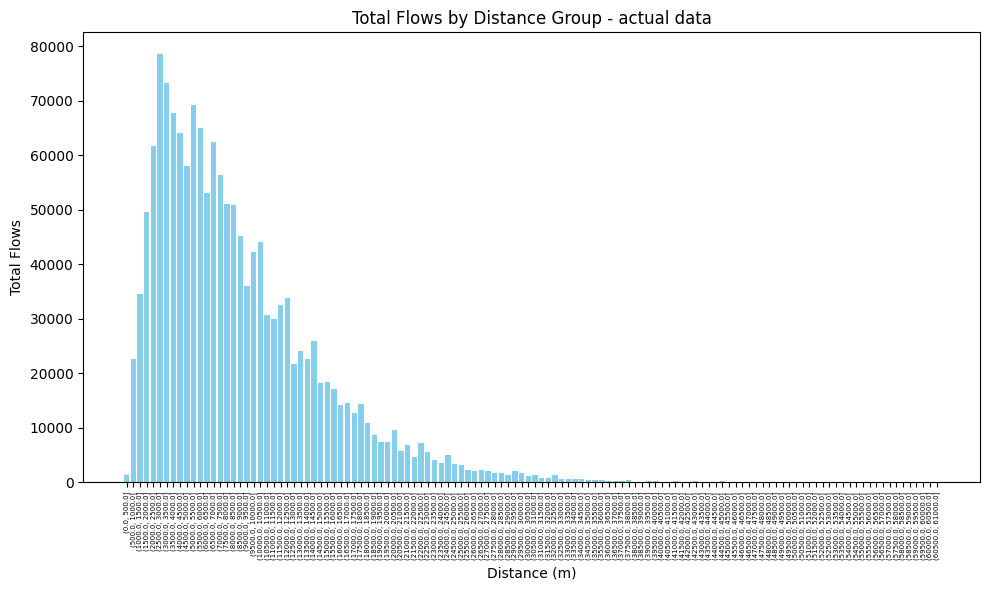

In [252]:
bin_size = 500
bins = np.arange(0, flows_41['distance'].max() + bin_size, bin_size)

flows_41['distance_group'] = pd.cut(flows_41['distance'], bins=bins)

grouped_flows = flows_41.groupby('distance_group')['flows'].sum().reset_index()

plt.figure(figsize=(10, 6))
plt.bar(grouped_flows['distance_group'].astype(str), grouped_flows['flows'], color='skyblue')
plt.xlabel('Distance (m)')
plt.ylabel('Total Flows')
plt.title('Total Flows by Distance Group - actual data')
plt.xticks(rotation=90, fontsize=5)
plt.tight_layout()
plt.show()

C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\3883029197.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_flows = flows_41.groupby('distance_group')['prodsimest4'].sum().reset_index()


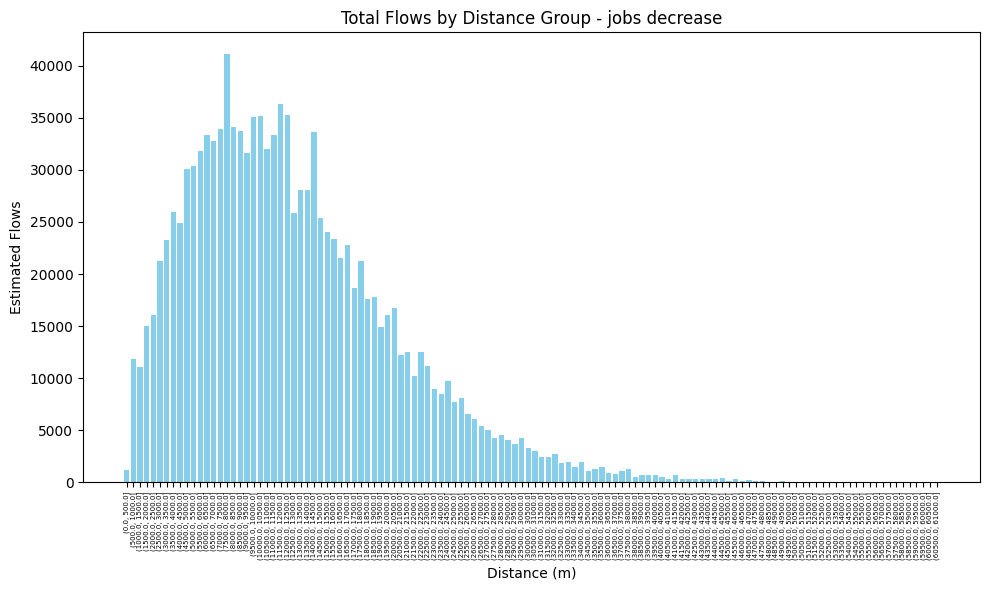

In [253]:
bin_size = 500
bins = np.arange(0, flows_41['distance'].max() + bin_size, bin_size)

flows_41['distance_group'] = pd.cut(flows_41['distance'], bins=bins)

grouped_flows = flows_41.groupby('distance_group')['prodsimest4'].sum().reset_index()

plt.figure(figsize=(10, 6))
plt.bar(grouped_flows['distance_group'].astype(str), grouped_flows['prodsimest4'], color='skyblue')
plt.xlabel('Distance (m)')
plt.ylabel('Estimated Flows')
plt.title('Total Flows by Distance Group - jobs decrease')
plt.xticks(rotation=90, fontsize=5)
plt.tight_layout()
plt.show()

C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\3243735111.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_flows = flows_42.groupby('distance_group')['prodsimest_newbeta'].sum().reset_index()


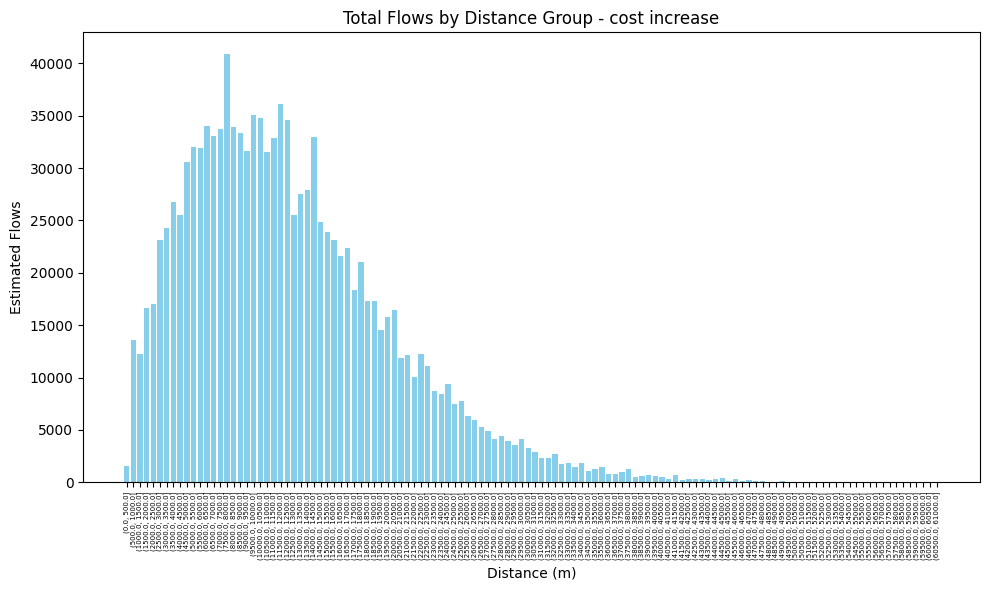

In [254]:
bin_size = 500
bins = np.arange(0, flows_42['distance'].max() + bin_size, bin_size)

flows_42['distance_group'] = pd.cut(flows_42['distance'], bins=bins)

grouped_flows = flows_42.groupby('distance_group')['prodsimest_newbeta'].sum().reset_index()

plt.figure(figsize=(10, 6))
plt.bar(grouped_flows['distance_group'].astype(str), grouped_flows['prodsimest_newbeta'], color='skyblue')
plt.xlabel('Distance (m)')
plt.ylabel('Estimated Flows')
plt.title('Total Flows by Distance Group - cost increase')
plt.xticks(rotation=90, fontsize=5)
plt.tight_layout()
plt.show()

C:\Users\avb19\AppData\Local\Temp\ipykernel_140552\2612865468.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_flows = flows_42U.groupby('distance_group')['prodsimest_ultrabeta'].sum().reset_index()


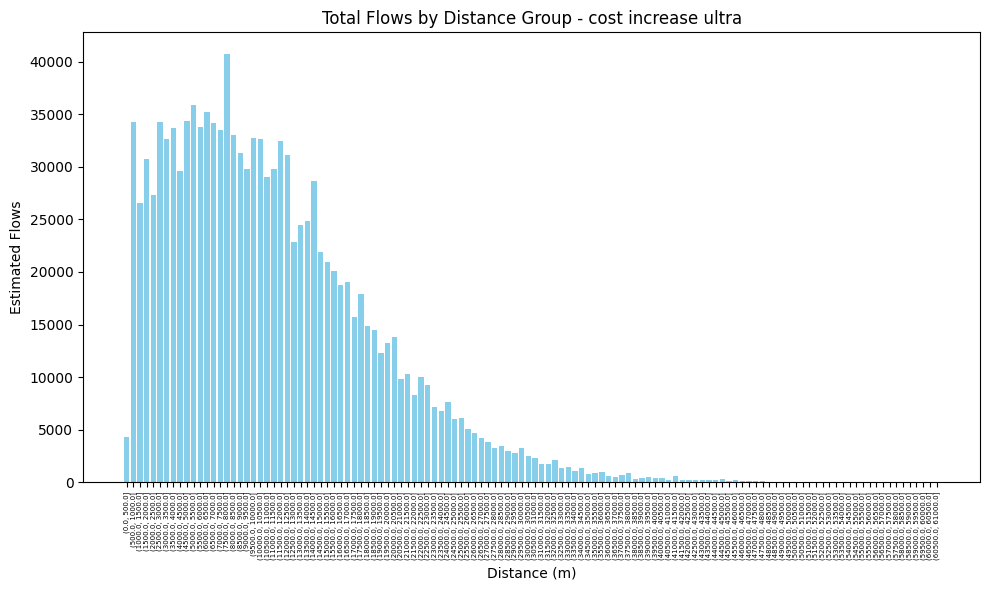

In [255]:
bin_size = 500
bins = np.arange(0, flows_42U['distance'].max() + bin_size, bin_size)

flows_42U['distance_group'] = pd.cut(flows_42U['distance'], bins=bins)

grouped_flows = flows_42U.groupby('distance_group')['prodsimest_ultrabeta'].sum().reset_index()

plt.figure(figsize=(10, 6))
plt.bar(grouped_flows['distance_group'].astype(str), grouped_flows['prodsimest_ultrabeta'], color='skyblue')
plt.xlabel('Distance (m)')
plt.ylabel('Estimated Flows')
plt.title('Total Flows by Distance Group - cost increase ultra')
plt.xticks(rotation=90, fontsize=5)
plt.tight_layout()
plt.show()

In [256]:
import networkx as nx
import matplotlib.pyplot as plt

G = nx.read_graphml('London_G.graph')

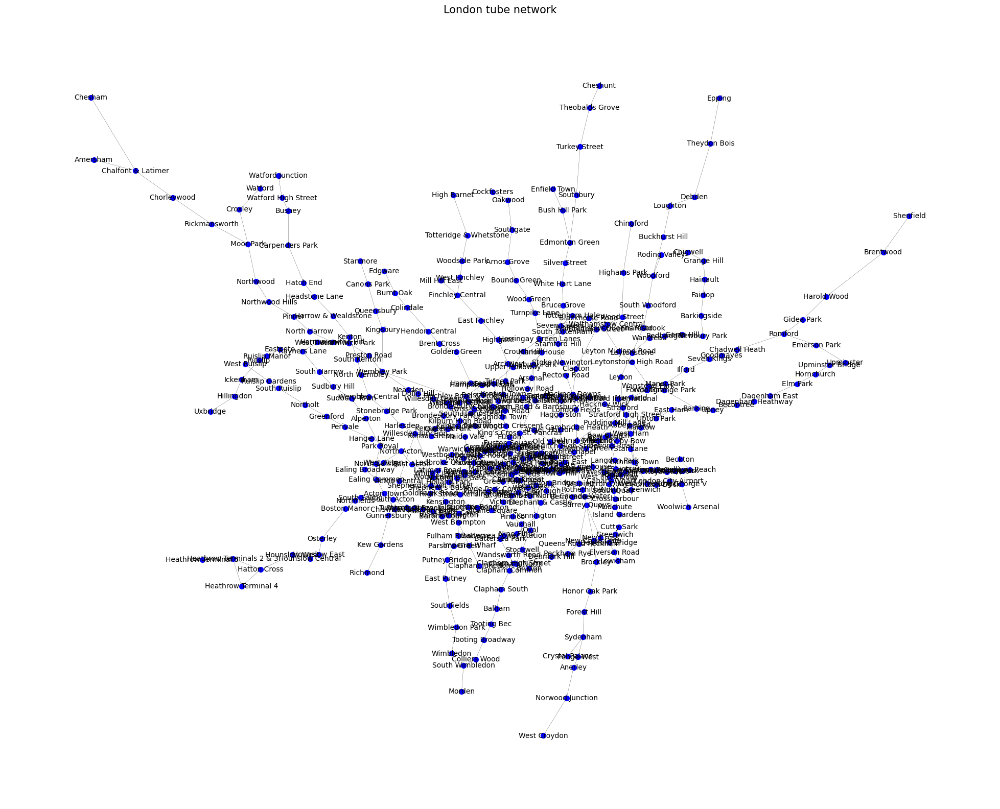

In [257]:
#since coords tuples are stored as string, need to convert them back to tuples using eval()

for node in G.nodes():
    G.nodes[node]['coords'] = eval(G.nodes[node]['coords'])


for node, data in G.nodes(data=True):
    data['station_name'] = node

# Let's plot the tube network! 

# We can plot the tube network with the names of the stations as labels

fig, ax = plt.subplots(figsize=(25,20))

node_labels = nx.get_node_attributes(G, 'station_name')

pos = nx.get_node_attributes(G, 'coords')

nx.draw_networkx_nodes(G,pos,node_size=50,node_color='blue')
nx.draw_networkx_edges(G,pos,arrows=False,width=0.2)
nx.draw_networkx_labels(G,pos, node_labels, font_size=10, font_color='black')

plt.title("London tube network",fontsize=15)
plt.axis("off")
plt.show()



C:\Users\avb19\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 22320 (\N{CJK UNIFIED IDEOGRAPH-5730}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\avb19\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 22270 (\N{CJK UNIFIED IDEOGRAPH-56FE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\avb19\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 21487 (\N{CJK UNIFIED IDEOGRAPH-53EF}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\avb19\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 35270 (\N{CJK UNIFIED IDEOGRAPH-89C6}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\avb19\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 212

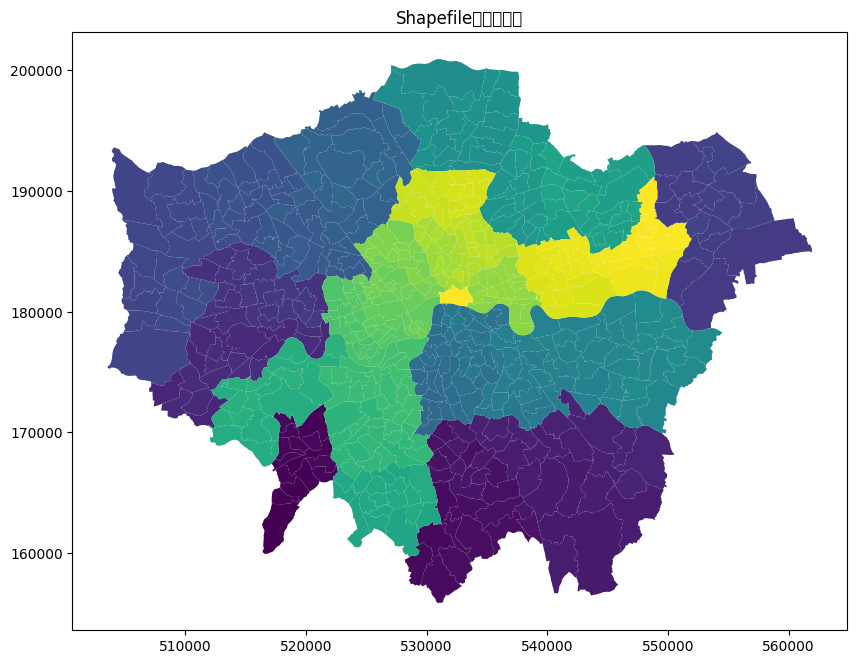

In [258]:
import geopandas as gpd
import matplotlib.pyplot as plt

shapefile = gpd.read_file('London-wards-2018_ESRI/London_Ward_CityMerged.shp')

shapefile.plot(figsize=(10, 10), cmap='viridis')

plt.title('Shapefile')

# 显示地图
plt.show()

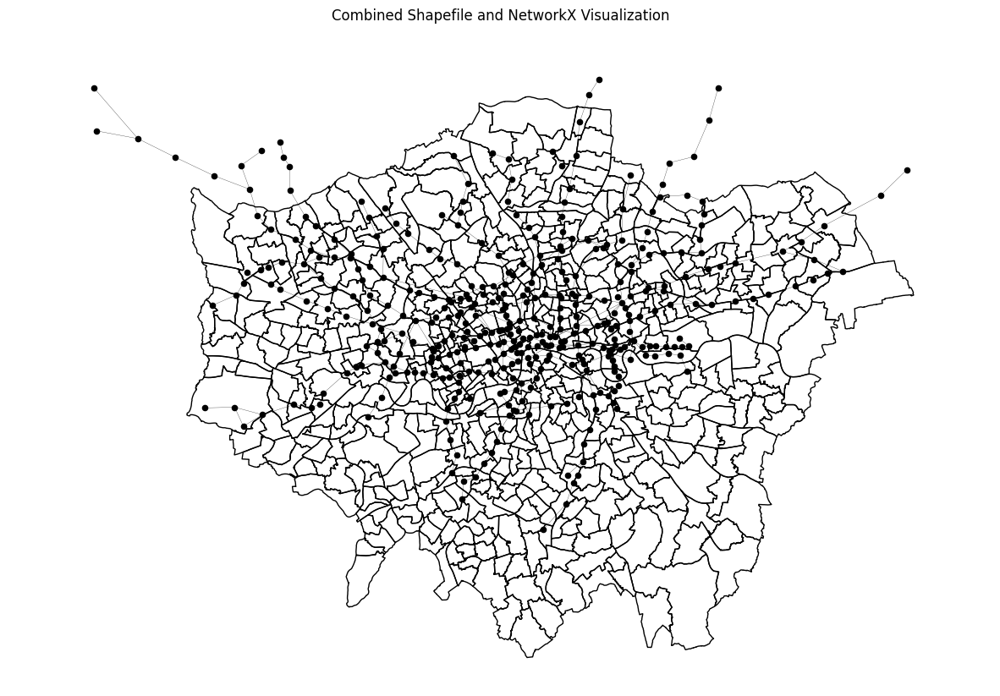

In [259]:
import geopandas as gpd
import matplotlib.pyplot as plt
import networkx as nx

shapefile = gpd.read_file('London-wards-2018_ESRI/London_Ward_CityMerged.shp')

fig, ax = plt.subplots(figsize=(15, 15))

shapefile.plot(ax=ax, facecolor='none',edgecolor='k')

plt.title('Combined Shapefile and NetworkX Visualization')

nx.draw_networkx_nodes(G, pos, node_size=20, node_color='black', ax=ax)
nx.draw_networkx_edges(G, pos, arrows=False, width=0.2, ax=ax)
# nx.draw_networkx_labels(G, pos, font_size=10, font_color='black', ax=ax)

plt.axis('off')  
plt.show()


# 40

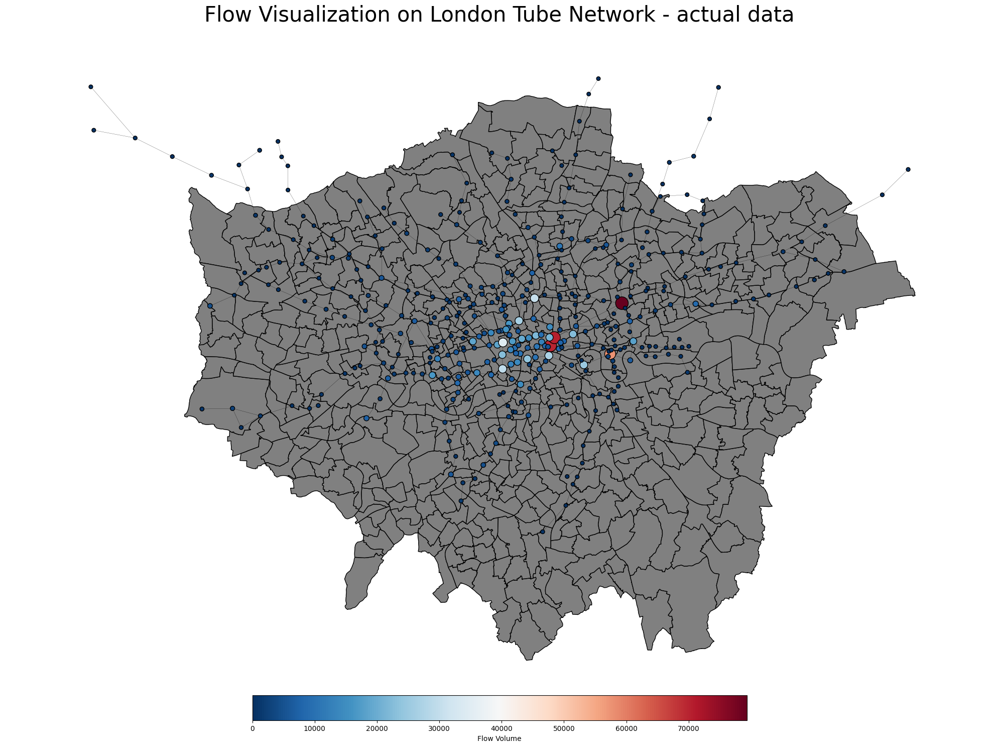

In [264]:
import geopandas as gpd
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np

shapefile = gpd.read_file('London-wards-2018_ESRI/London_Ward_CityMerged.shp')

fig, ax = plt.subplots(figsize=(20, 20))

shapefile.plot(ax=ax, facecolor='grey', edgecolor='k')

plt.title('Flow Visualization on London Tube Network - actual data', fontsize=30)

flows = [df_40[df_40['station_destination'] == node]['flows'].values[0] if node in df_40['station_destination'].values else 0 for node in G.nodes()]
flows_norm = np.array(flows)
min_flow, max_flow = flows_norm.min(), flows_norm.max()

flows_norm = (flows_norm - min_flow) / (max_flow - min_flow + 1e-5)

node_sizes = (flows_norm * 300) + 30 

nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=flows_norm, cmap='RdBu_r', ax=ax, edgecolors='k')
nx.draw_networkx_edges(G, pos, arrows=False, width=0.2, ax=ax)

plt.axis('off')  

cbar = plt.colorbar(plt.cm.ScalarMappable(cmap='RdBu_r', norm=plt.Normalize(vmin=min_flow, vmax=max_flow)),
                    ax=ax, orientation='horizontal', pad=0.005, shrink=0.5)  # 减小pad值来减少距离
cbar.set_label('Flow Volume')

plt.tight_layout()

plt.show()


# 41

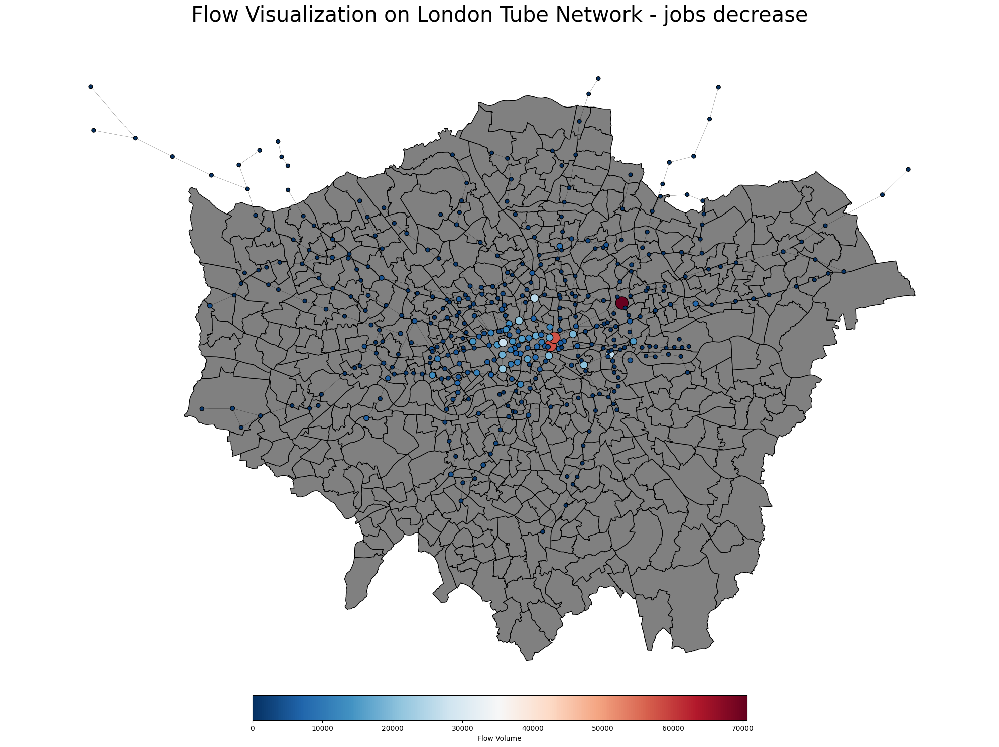

In [265]:
import geopandas as gpd
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np

shapefile = gpd.read_file('London-wards-2018_ESRI/London_Ward_CityMerged.shp')

fig, ax = plt.subplots(figsize=(20, 20))

shapefile.plot(ax=ax, facecolor='grey', edgecolor='k')

plt.title('Flow Visualization on London Tube Network - jobs decrease', fontsize=30)

flows = [df_41[df_41['station_destination'] == node]['flows'].values[0] if node in df_41['station_destination'].values else 0 for node in G.nodes()]
flows_norm = np.array(flows)
min_flow, max_flow = flows_norm.min(), flows_norm.max()

flows_norm = (flows_norm - min_flow) / (max_flow - min_flow + 1e-5)

node_sizes = (flows_norm * 300) + 30   

nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=flows_norm, cmap='RdBu_r', ax=ax, edgecolors='k')
nx.draw_networkx_edges(G, pos, arrows=False, width=0.2, ax=ax)

plt.axis('off') 

cbar = plt.colorbar(plt.cm.ScalarMappable(cmap='RdBu_r', norm=plt.Normalize(vmin=min_flow, vmax=max_flow)), ax=ax, orientation='horizontal', pad=0.005, shrink=0.5)
cbar.set_label('Flow Volume')

plt.tight_layout()

plt.show()


# 42

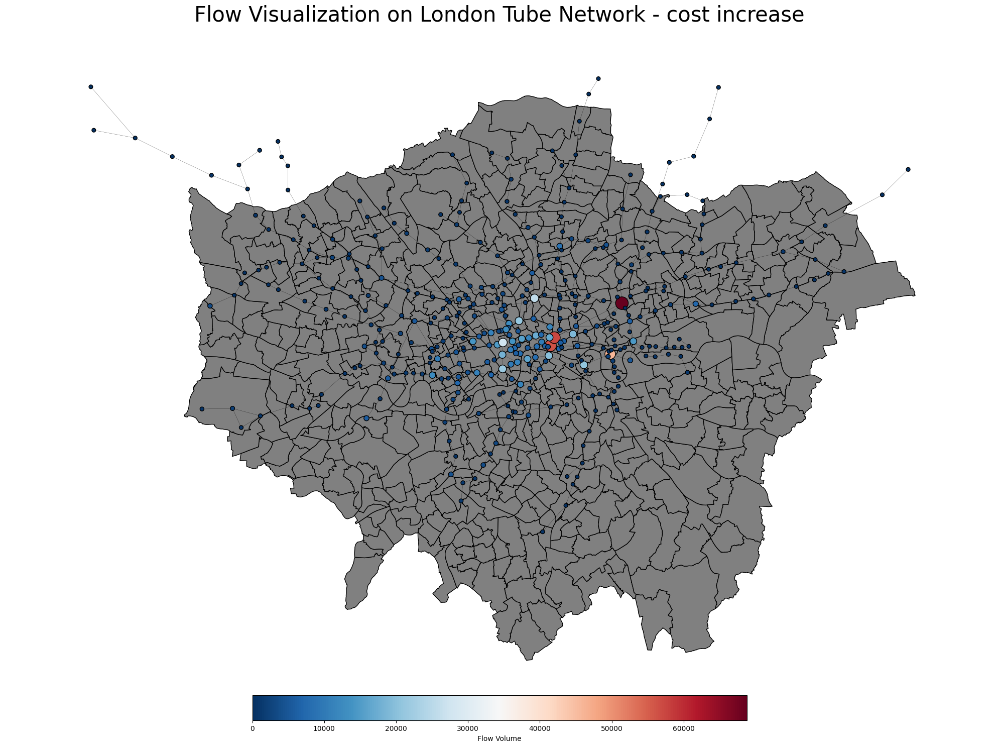

In [260]:
import geopandas as gpd
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np

shapefile = gpd.read_file('London-wards-2018_ESRI/London_Ward_CityMerged.shp')

fig, ax = plt.subplots(figsize=(20, 20))


shapefile.plot(ax=ax, facecolor='grey', edgecolor='k')

plt.title('Flow Visualization on London Tube Network - cost increase', fontsize=30)

flows = [df_42[df_42['station_destination'] == node]['flows'].values[0] if node in df_42['station_destination'].values else 0 for node in G.nodes()]
flows_norm = np.array(flows)
min_flow, max_flow = flows_norm.min(), flows_norm.max()
flows_norm = (flows_norm - min_flow) / (max_flow - min_flow + 1e-5)
node_sizes = (flows_norm * 300) + 30  

nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=flows_norm, cmap='RdBu_r', ax=ax, edgecolors='k')
nx.draw_networkx_edges(G, pos, arrows=False, width=0.2, ax=ax)

plt.axis('off')  

cbar = plt.colorbar(plt.cm.ScalarMappable(cmap='RdBu_r', norm=plt.Normalize(vmin=min_flow, vmax=max_flow)), ax=ax, orientation='horizontal', pad=0.005, shrink=0.5)
cbar.set_label('Flow Volume')

plt.tight_layout()

plt.show()


# 42_U

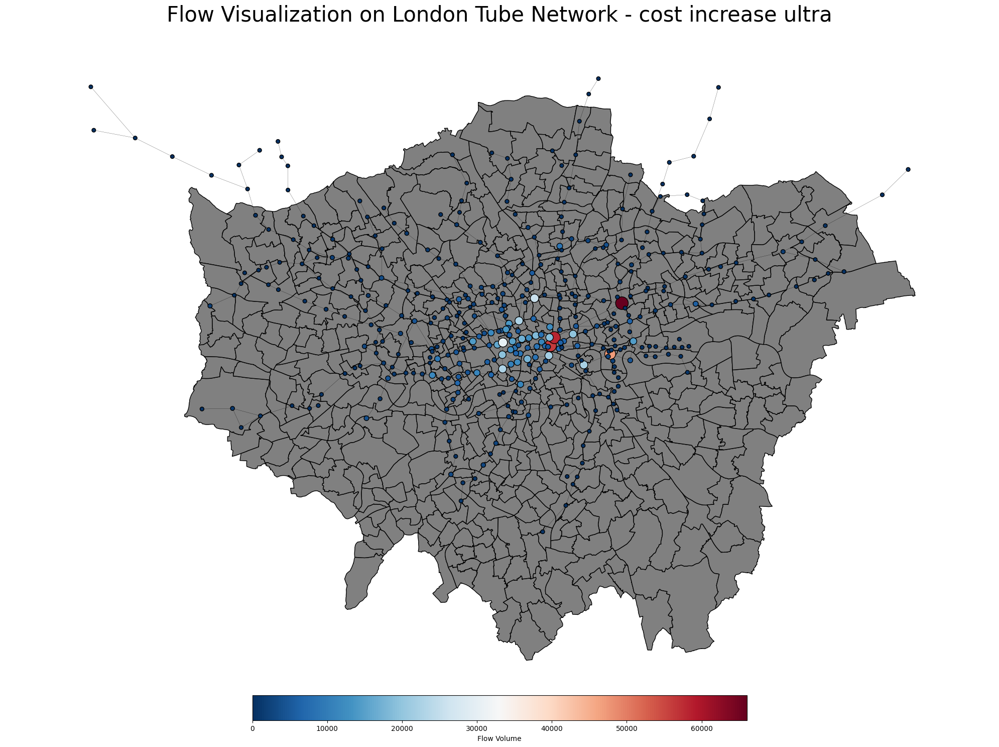

In [263]:
import geopandas as gpd
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np

shapefile = gpd.read_file('London-wards-2018_ESRI/London_Ward_CityMerged.shp')

fig, ax = plt.subplots(figsize=(20, 20))

shapefile.plot(ax=ax, facecolor='grey', edgecolor='k')

plt.title('Flow Visualization on London Tube Network - cost increase ultra', fontsize=30)

flows = [df_42U[df_42U['station_destination'] == node]['flows'].values[0] if node in df_42U['station_destination'].values else 0 for node in G.nodes()]
flows_norm = np.array(flows)
min_flow, max_flow = flows_norm.min(), flows_norm.max()
flows_norm = (flows_norm - min_flow) / (max_flow - min_flow + 1e-5)
node_sizes = (flows_norm * 300) + 30  

nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=flows_norm, cmap='RdBu_r', ax=ax, edgecolors='k')
nx.draw_networkx_edges(G, pos, arrows=False, width=0.2, ax=ax)

plt.axis('off') 

cbar = plt.colorbar(plt.cm.ScalarMappable(cmap='RdBu_r', norm=plt.Normalize(vmin=min_flow, vmax=max_flow)), ax=ax, orientation='horizontal', pad=0.005, shrink=0.5)
cbar.set_label('Flow Volume')

plt.tight_layout()

plt.show()


# 42U

In [305]:
df_42U_sorted.head(10)

,station_destination,flows
327,Stratford,66020.0
213,Liverpool Street,58031.0
15,Bank and Monument,56106.0
55,Canary Wharf,47045.0
252,Oxford Circus,30183.0
168,Highbury & Islington,25541.0
356,Victoria,22893.0
198,King's Cross St. Pancras,22834.0
54,Canada Water,22199.0
214,London Bridge,21848.0


In [306]:
df_40_sorted.head(10)

,station_destination,flows
327,Stratford,79320.0
213,Liverpool Street,70354.0
15,Bank and Monument,69987.0
55,Canary Wharf,57475.0
252,Oxford Circus,34539.0
168,Highbury & Islington,30591.0
356,Victoria,29682.0
214,London Bridge,27037.0
198,King's Cross St. Pancras,26633.0
54,Canada Water,24826.0


In [307]:
import pandas as pd

merged_df_42U = pd.merge(df_42U_sorted, df_40_sorted, on='station_destination', suffixes=('_42U', '_40'))

merged_df_42U['flows_difference'] = merged_df_42U['flows_42U'] - merged_df_42U['flows_40']

merged_df_42U.head(10)


,station_destination,flows_42U,flows_40,flows_difference
0,Stratford,66020.0,79320.0,-13300.0
1,Liverpool Street,58031.0,70354.0,-12323.0
2,Bank and Monument,56106.0,69987.0,-13881.0
3,Canary Wharf,47045.0,57475.0,-10430.0
4,Oxford Circus,30183.0,34539.0,-4356.0
5,Highbury & Islington,25541.0,30591.0,-5050.0
6,Victoria,22893.0,29682.0,-6789.0
7,King's Cross St. Pancras,22834.0,26633.0,-3799.0
8,Canada Water,22199.0,24826.0,-2627.0
9,London Bridge,21848.0,27037.0,-5189.0


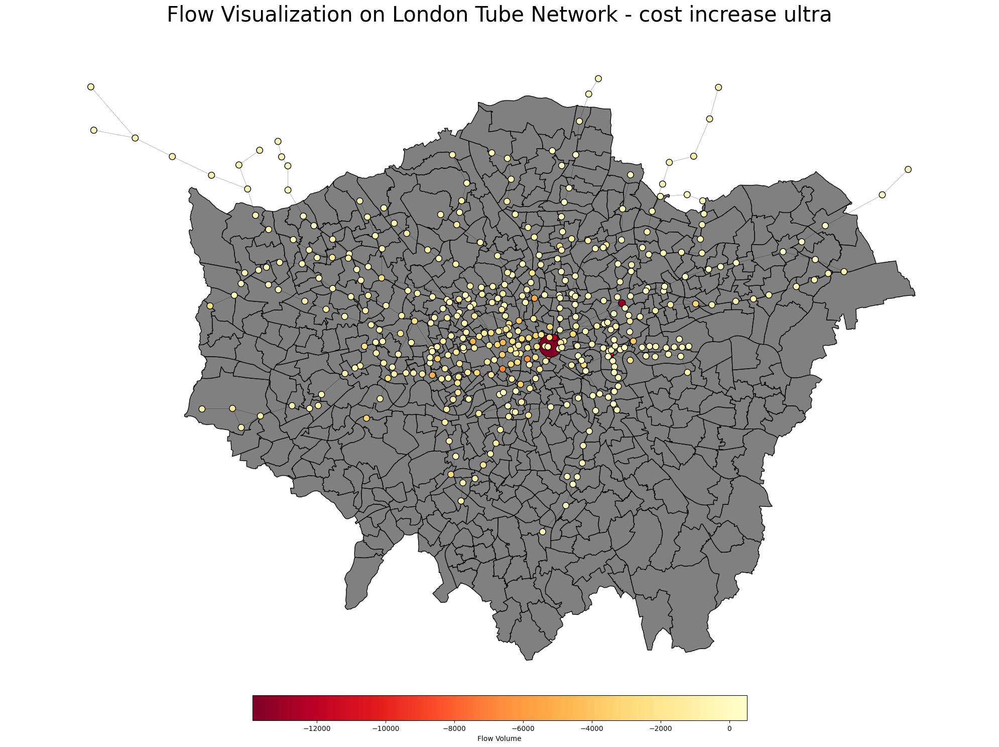

In [308]:
import geopandas as gpd
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np

shapefile = gpd.read_file('London-wards-2018_ESRI/London_Ward_CityMerged.shp')

fig, ax = plt.subplots(figsize=(20, 20))

shapefile.plot(ax=ax, facecolor='grey', edgecolor='k')

plt.title('Flow Visualization on London Tube Network - cost increase ultra', fontsize=30)

flows = [merged_df_42U[merged_df_42U['station_destination'] == node]['flows_difference'].values[0] if node in merged_df_42U['station_destination'].values else 0 for node in G.nodes()]
flows_norm = np.array(flows)
min_flow, max_flow = flows_norm.min(), flows_norm.max()

flows_norm = (flows_norm - min_flow) / (max_flow - min_flow + 1e-5)

node_sizes = 1 / (flows_norm + 1e-3) + 80   

nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=flows_norm, cmap='YlOrRd_r', ax=ax, edgecolors='k')
nx.draw_networkx_edges(G, pos, arrows=False, width=0.2, ax=ax)

plt.axis('off')  

cbar = plt.colorbar(plt.cm.ScalarMappable(cmap='YlOrRd_r', norm=plt.Normalize(vmin=min_flow, vmax=max_flow)), ax=ax, orientation='horizontal', pad=0.005, shrink=0.5)
cbar.set_label('Flow Volume')

plt.tight_layout()

plt.show()


# 42

In [309]:
import pandas as pd

merged_df_42 = pd.merge(df_42_sorted, df_40_sorted, on='station_destination', suffixes=('_42', '_40'))

merged_df_42['flows_difference'] = merged_df_42['flows_42'] - merged_df_42['flows_40']

merged_df_42.head(10)


,station_destination,flows_42,flows_40,flows_difference
0,Stratford,68770.0,79320.0,-10550.0
1,Liverpool Street,57444.0,70354.0,-12910.0
2,Bank and Monument,56217.0,69987.0,-13770.0
3,Canary Wharf,45785.0,57475.0,-11690.0
4,Oxford Circus,27664.0,34539.0,-6875.0
5,Highbury & Islington,25610.0,30591.0,-4981.0
6,Victoria,21661.0,29682.0,-8021.0
7,King's Cross St. Pancras,21199.0,26633.0,-5434.0
8,Canada Water,20779.0,24826.0,-4047.0
9,London Bridge,20002.0,27037.0,-7035.0


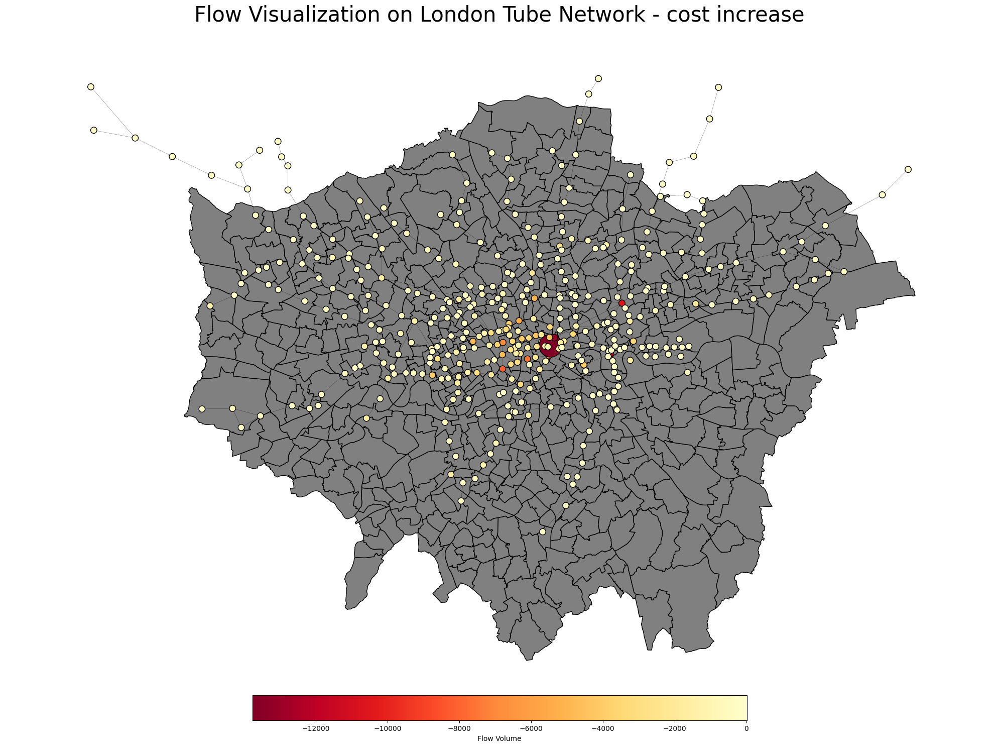

In [320]:
import geopandas as gpd
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np

shapefile = gpd.read_file('London-wards-2018_ESRI/London_Ward_CityMerged.shp')

fig, ax = plt.subplots(figsize=(20, 20))

shapefile.plot(ax=ax, facecolor='grey', edgecolor='k')

plt.title('Flow Visualization on London Tube Network - cost increase', fontsize=30)

flows = [merged_df_42[merged_df_42['station_destination'] == node]['flows_difference'].values[0] if node in merged_df_42['station_destination'].values else 0 for node in G.nodes()]
flows_norm = np.array(flows)
min_flow, max_flow = flows_norm.min(), flows_norm.max()

flows_norm = (flows_norm - min_flow) / (max_flow - min_flow + 1e-5)

node_sizes = 1 / (flows_norm + 1e-3) + 80  

nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=flows_norm, cmap='YlOrRd_r', ax=ax, edgecolors='k')
nx.draw_networkx_edges(G, pos, arrows=False, width=0.2, ax=ax)

plt.axis('off')  

cbar = plt.colorbar(plt.cm.ScalarMappable(cmap='YlOrRd_r', norm=plt.Normalize(vmin=min_flow, vmax=max_flow)), ax=ax, orientation='horizontal', pad=0.005, shrink=0.5)
cbar.set_label('Flow Volume')

plt.tight_layout()

plt.show()


# 41

In [311]:
import pandas as pd

merged_df_41 = pd.merge(df_41_sorted, df_40_sorted, on='station_destination', suffixes=('_41', '_40'))

merged_df_41['flows_difference'] = merged_df_41['flows_41'] - merged_df_41['flows_40']

merged_df_41.head(10)


,station_destination,flows_41,flows_40,flows_difference
0,Stratford,70526.0,79320.0,-8794.0
1,Bank and Monument,57944.0,69987.0,-12043.0
2,Liverpool Street,57784.0,70354.0,-12570.0
3,Oxford Circus,27644.0,34539.0,-6895.0
4,Canary Wharf,26661.0,57475.0,-30814.0
5,Highbury & Islington,25782.0,30591.0,-4809.0
6,Victoria,21747.0,29682.0,-7935.0
7,King's Cross St. Pancras,21215.0,26633.0,-5418.0
8,Canada Water,20784.0,24826.0,-4042.0
9,London Bridge,20014.0,27037.0,-7023.0


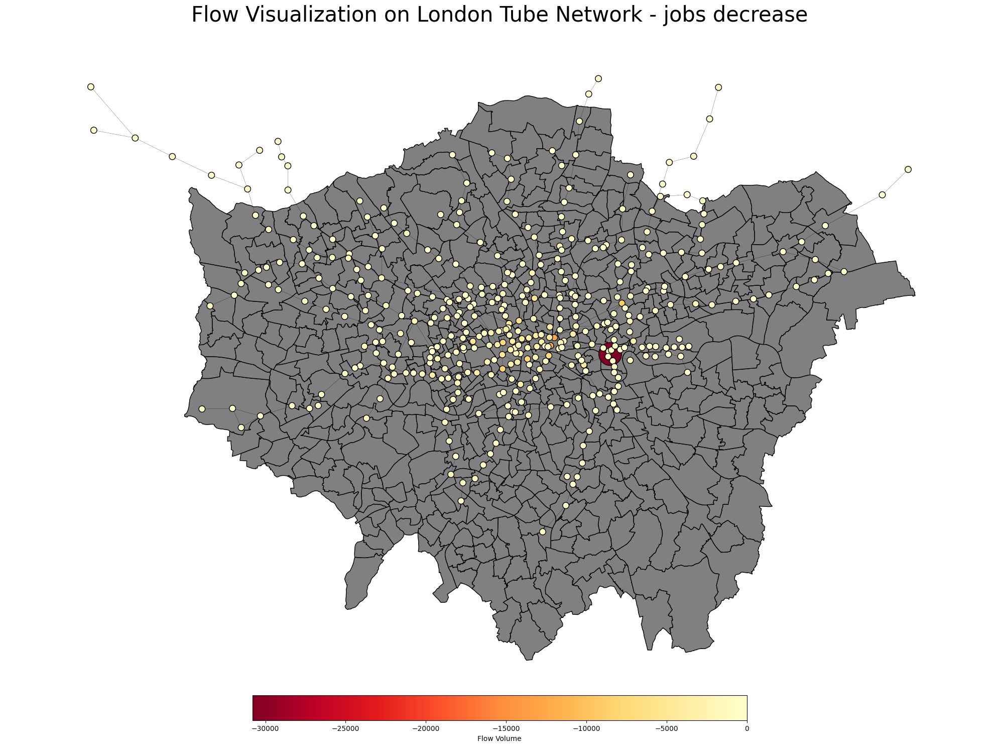

In [312]:
import geopandas as gpd
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np

shapefile = gpd.read_file('London-wards-2018_ESRI/London_Ward_CityMerged.shp')

fig, ax = plt.subplots(figsize=(20, 20))

shapefile.plot(ax=ax, facecolor='grey', edgecolor='k')

plt.title('Flow Visualization on London Tube Network - jobs decrease', fontsize=30)

flows = [merged_df_41[merged_df_41['station_destination'] == node]['flows_difference'].values[0] if node in merged_df_41['station_destination'].values else 0 for node in G.nodes()]
flows_norm = np.array(flows)
min_flow, max_flow = flows_norm.min(), flows_norm.max()

flows_norm = (flows_norm - min_flow) / (max_flow - min_flow + 1e-5)

node_sizes = 1 / (flows_norm + 1e-3) + 80  

nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=flows_norm, cmap='YlOrRd_r', ax=ax, edgecolors='k')
nx.draw_networkx_edges(G, pos, arrows=False, width=0.2, ax=ax)

plt.axis('off')  

cbar = plt.colorbar(plt.cm.ScalarMappable(cmap='YlOrRd_r', norm=plt.Normalize(vmin=min_flow, vmax=max_flow)), ax=ax, orientation='horizontal', pad=0.005, shrink=0.5)
cbar.set_label('Flow Volume')

plt.tight_layout()

plt.show()
